# **Deep Learning Analysis**

> **"(1) `실제 데이터`에 머신러닝과 딥러닝 알고리즘으로 데이터분석 프로세스를 완성하고,"**
>
> **"(2) `딥러닝 알고리즘의 한계점을 보완`하기 위해 `Vanishing Gradient 이슈, 과적합 이슈, 하이퍼파라미터 최적화 등`으로 개선"**

[![Open in Colab](http://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/thekimk/All-About-Deep-Learning/blob/main/Practice4-2_DeepLearning_RegressionClassification_KK.ipynb)

<center><img src='Image/Expert/DataAnalysis_Cycle0.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle1.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle2.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle3.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle4.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle5.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle6.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle7.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle8.png' width='800'></center>
<center><img src='Image/Expert/DataAnalysis_Cycle9.png' width='800'></center>

# **Import Library:** 분석에 사용할 모듈 설치

In [1]:
!pip install --upgrade pip
!python -m pip install --user --upgrade pip

In [2]:
# Baseline 알고리즘 설치하기
!pip install xgboost --user --upgrade
!pip install lightgbm --user --upgrade
!pip install catboost --user --upgrade
!pip install mlxtend --user --upgrade

In [3]:
# # Tensorflow 및 Keras 설치하기
# !pip install tensorflow
# !pip install keras
# !pip install keras-tqdm

In [4]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Data manipulation and visualization
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 20
pd.options.display.max_columns = 20
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

# Modeling algorithms
# General
import statsmodels.api as sm
from scipy import stats
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.get_logger().warning('test')
from tensorflow import keras
from tensorflow.keras import layers, regularizers, callbacks
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Dense, concatenate, Activation, Flatten, Dropout, Reshape
from tensorflow.python.keras.utils import np_utils
from tensorflow.keras.utils import plot_model

# Regression
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR, SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree, export_text, export_graphviz
from sklearn.ensemble import VotingRegressor, BaggingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, StackingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from xgboost import plot_importance as plot_importance_xgb
from lightgbm import plot_importance as plot_importance_lgbm
from catboost import Pool, CatBoostRegressor
from mlxtend.regressor import StackingRegressor, StackingCVRegressor

# Classification
from sklearn.linear_model import LogisticRegression
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree, export_text, export_graphviz
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.ensemble import VotingClassifier, BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, StackingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from xgboost import plot_importance as plot_importance_xgb
from lightgbm import plot_importance as plot_importance_lgbm
from catboost import Pool, CatBoostClassifier
from mlxtend.classifier import StackingClassifier, StackingCVClassifier
from mlxtend.plotting import plot_decision_regions

# Model selection
from sklearn.model_selection import train_test_split, GridSearchCV

# Evaluation metrics
from sklearn import metrics
# for regression
from sklearn.metrics import mean_squared_error,  mean_absolute_error, mean_absolute_percentage_error
# for classification
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc, precision_recall_curve

2025-04-07 01:33:20.322998: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-07 01:33:20.336844: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743957200.350201  526644 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743957200.353894  526644 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-07 01:33:20.367648: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

# **Regression Problem:** 보스턴 집값 예측

|   **변수**  |              **설명**              |
|:-------:|:------------------------------:|
|  **Price**  |            주택 가격           |
|   **CRIM**  |        1인당 범죄 발생률       |
|    **ZN**   |       주택용 토지의 비율       |
|  **INDUS**  |      비소매 상업지역 비율      |
|   **CHAS**  |    찰스강 인접 여부(인접=1)    |
|   **NOX**   |         일산화질소 농도        |
|    **RM**   |            방의 개수           |
|   **AGE**   | 1940년 이전에 건축된 주택 비율 |
|   **DIS**   |     주요 5대 회사와의 거리     |
|   **RAD**   |         고속도로 접근성        |
|   **TAX**   |             재산세             |
| **PTRATIO** |       교사와 학생의 비율       |
|    **B**    |         흑인 거주 비율         |
|  **LSTAT**  |          저소득층 비율         |

## Linear Regression

**1) 알고리즘 함수세팅:** 

$$
\begin{aligned}
Y \approx \hat{Y} &= f(X_1, X_2, ..., X_k) = w_0 + w_1X_1 + w_2X_2 + \cdots + w_kX_k 
= [w_0~w_1~w_2~\cdots~w_k]\begin{bmatrix} 1 \\ X_1 \\ X_2 \\ \vdots \\ X_k \end{bmatrix} \\
&= [1~X_1~X_2~\cdots~X_k]\begin{bmatrix} w_0 \\ w_1 \\ w_2 \\ \vdots \\ w_k \end{bmatrix} 
= \begin{bmatrix} 1~X_{11}~X_{21}~\cdots~X_{k1} \\ 1~X_{12}~X_{22}~\cdots~X_{k2} \\ \vdots \\ 1~X_{1t}~X_{2t}~\cdots~X_{kt} \end{bmatrix}
\begin{bmatrix} w_0 \\ w_1 \\ w_2 \\ \vdots \\ w_k \end{bmatrix} = XW = WX
\end{aligned}
$$

---

<center><img src='Image/Expert/Example_LinearRegression.png' width='900'></center>

**2) 함수 추정을 위한 비용함수:** 나의 주장 기반 알고리즘의 `예측값`($\hat{Y}$)과 `실제 데이터`($Y$)의 차이를 평가하는 함수
> - **손실함수(Loss Function):** `하나의 데이터(Single Row)`에서 예측값과 정답의 차이를 평가
> - **비용함수(Cost Function):** `모든 데이터`에서 예측값과 정답의 차이를 평가
> 
> $$
\begin{aligned}
Y - \hat{Y} &= Y - WX = \text{residual} = \text{cost} \\
&= \sum_{i=1}^{m} \left[ \sum_{j=1}^{k} (Y_{i} - w_{j}X_{j}) \right]
\end{aligned}
$$
>
>
> - `회귀분석`은 여러가지의 비용함수 중 `최소제곱법/최소자승법`을 사용 
> - `최소제곱법/최소자승법`를 최소로 하는 `직선`을 추정하여 `계수(coefficient)`를 결정
>
$$
\begin{aligned}
\hat{W} = \underset{W}{\arg\min} \sum_{i=1}^{m} \left[\sum_{j=1}^{k} (Y_{i} - w_{j}X_{j})^2 \right]
\end{aligned}
$$


<!-- - **비선형변수 효과:** 로그 또는 제곱근 등의 변환된 변수 사용시 회귀분석 성능 향상 가능
    - 독립 변수나 종속 변수가 심하게 한쪽으로 치우친 분포를 보이는 경우
    - 독립 변수와 종속 변수간의 관계가 곱셈 혹은 나눗셉으로 연결된 경우
    - 종속 변수와 예측치가 비선형 관계를 보이는 경우 -->

(404, 13) (404, 1)
(102, 13) (102, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.752
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     68.67
Date:                Mon, 07 Apr 2025   Prob (F-statistic):          2.71e-105
Time:                        01:33:22   Log-Likelihood:                -1188.7
No. Observations:                 404   AIC:                             2413.
Df Residuals:                     386   BIC:                             2486.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.1290      2.030      8.439      0.000      13.138      21.120
CRIM          -9.7685      3.129     -3.122      0.002     -15.921      -3.616
ZN             3.6059      1.538      2.345      0.020       0.583       6.629
INDUS         -1.0711      1.956     -0.548      0.584      -4.917       2.774
NOX           -6.8870      2.163     -3.184      0.002     -11.140      -2.634
RM            28.7478      2.137     13.453      0.000      24.546      32.949
AGE           -3.1799      1.386     -2.294      0.022      -5.906      -0.454
DIS          -14.1170      2.480     -5.691      0.000     -18.994      -9.240
RAD           10.9837      4.247      2.586      0.010       2.633      19.334
PTRATIO       -8.1534      1.388     -5.874      0.000     -10.882      -5.424
B              4.1760      1.233      3.387      0.001       1.752       6.600
LSTAT        -10.0753      2.011     -5.010      0.000     -14.029      -6.122
TAX_2         -5.2255      1.405     -3.719      0.000      -7.988      -2.463
TAX_3         -5.7704      1.463     -3.945      0.000      -8.646      -2.894
TAX_4         -5.2109      1.538     -3.389      0.001      -8.234      -2.187
TAX_6        -13.2573      4.293     -3.088      0.002     -21.697      -4.817
TAX_7         -6.4422      2.668     -2.414      0.016     -11.688      -1.196
CHAS_0         7.7912      1.035      7.528      0.000       5.756       9.826
CHAS_1         9.3378      1.235      7.559      0.000       6.909      11.767
==============================================================================
Omnibus:                      241.516   Durbin-Watson:                   2.188
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3120.749
Skew:                           2.289   Prob(JB):                         0.00
Kurtosis:                      15.823   Cond. No.                     8.08e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.89e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

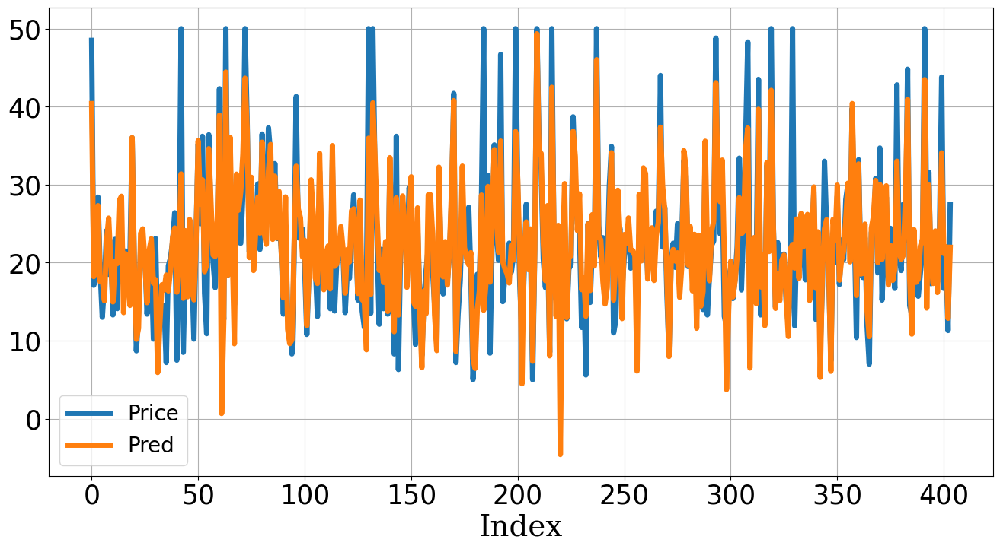

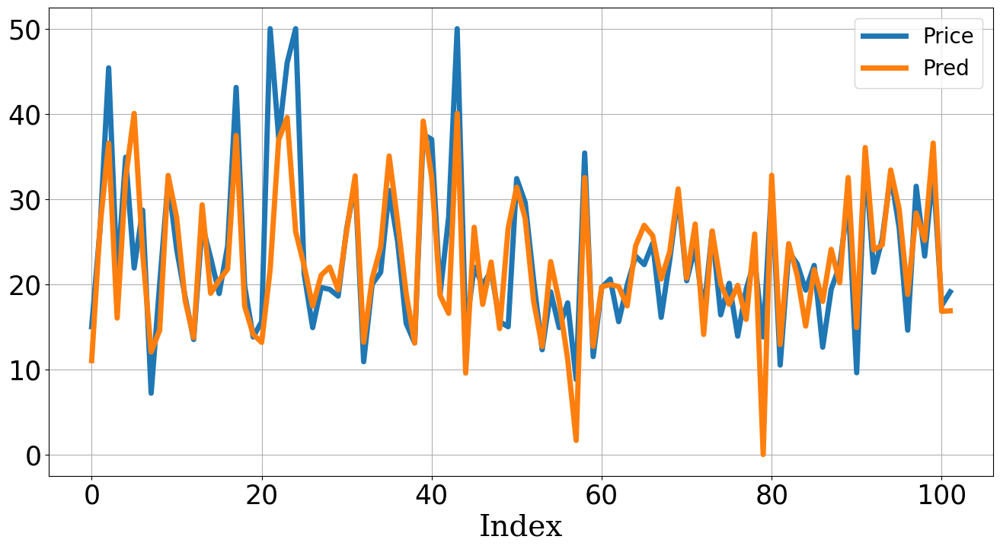

,MAE,MSE,MAPE
Train,3.07,21.05,0.16
Test,3.51,31.34,0.17


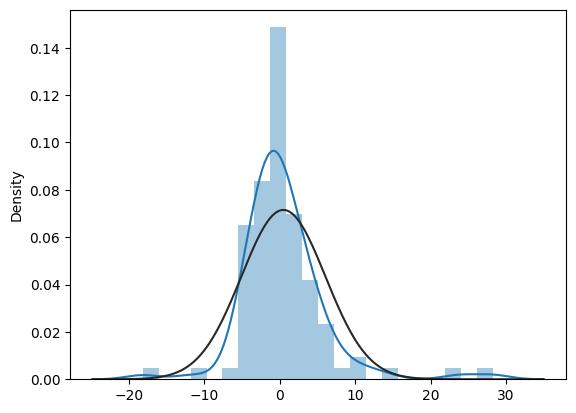

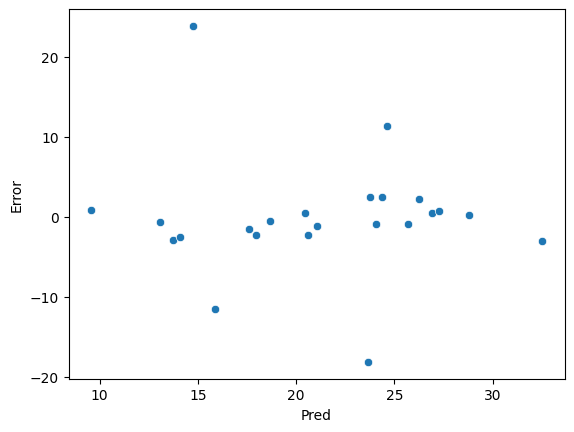

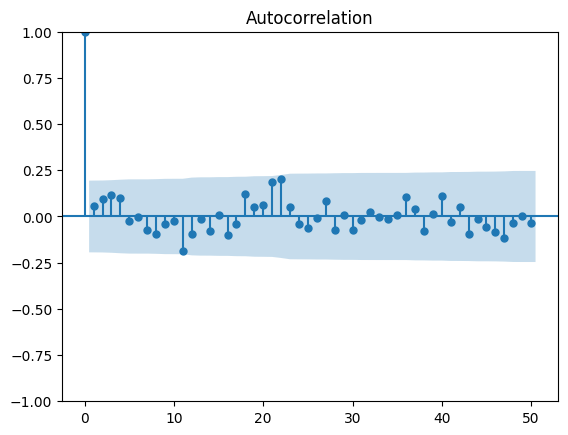

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.83,0.13,5.77,41.83
p-value,0.00,0.00,0.83,0.79
Alternative,NaN,two-sided,NaN,NaN


In [5]:
# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Linear Regression
X_train_fes = sm.add_constant(X_train_fes)
X_test_fes = sm.add_constant(X_test_fes)
model_lr = sm.OLS(Y_train, X_train_fes).fit()
display(model_lr.summary())

Y_trpred = pd.DataFrame(model_lr.predict(X_train_fes), columns=['Pred'])
Y_tepred = pd.DataFrame(model_lr.predict(X_test_fes), columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_lr = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_lr)

# 에러 분석
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Random Forest (Bagging)

**"데이터를 `복원샘플링`하여 나눈 샘플들로 `같은 알고리즘`으로 학습 후 `보팅` 방식으로 최종 예측"**

<center><img src='Image/Expert/Ensemble_Bagging.jpg' width='400'></center> 

(404, 13) (404, 1)
(102, 13) (102, 1)


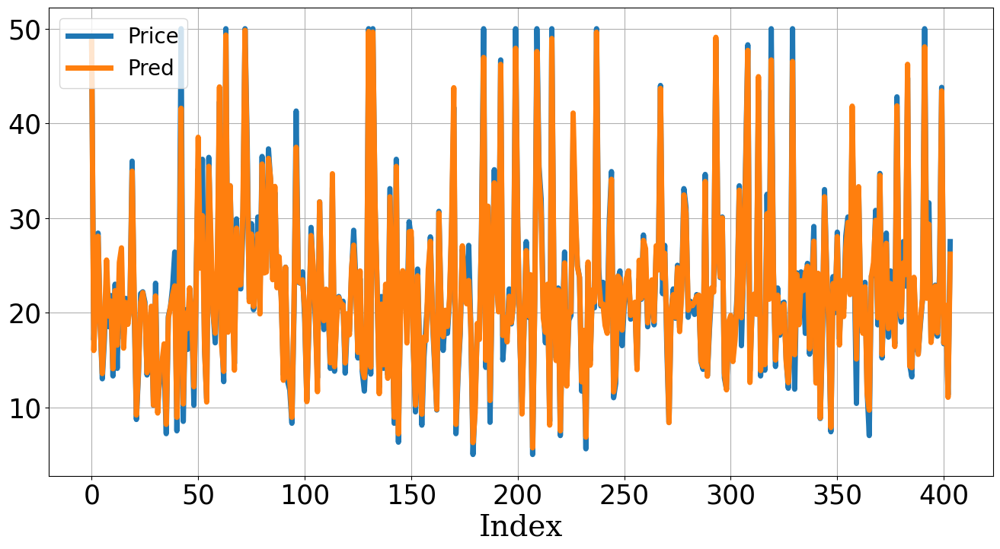

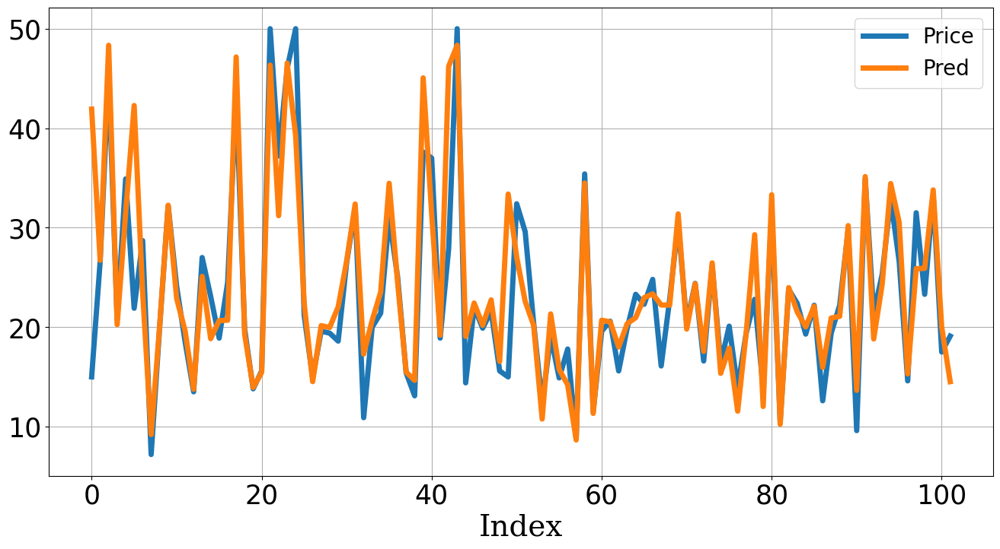

,MAE,MSE,MAPE
Train,0.86,1.55,0.04
Test,2.71,25.67,0.13


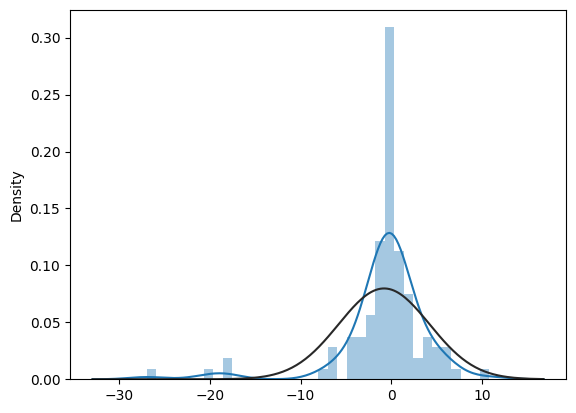

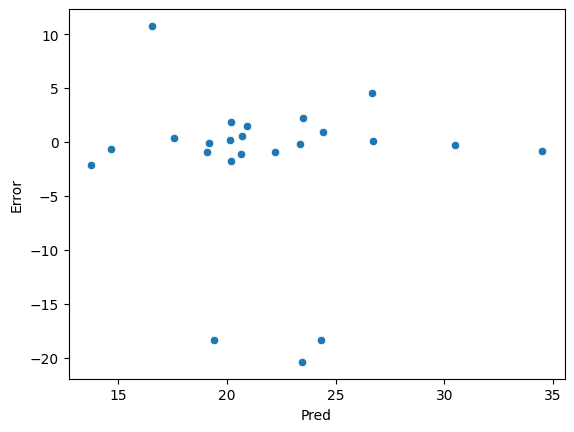

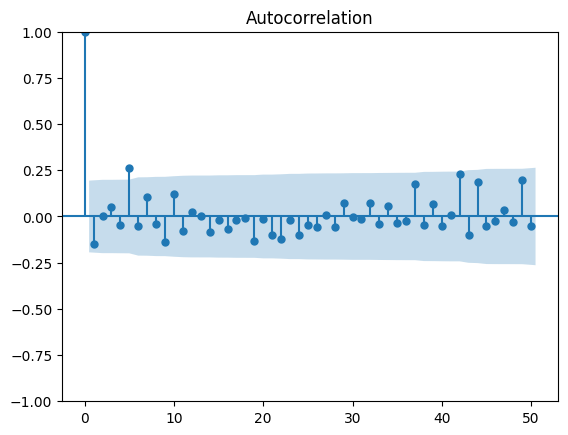

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.73,0.12,15.91,62.15
p-value,0.00,0.00,0.10,0.12
Alternative,NaN,two-sided,NaN,NaN


In [6]:
# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Random Forest
model_rf = RandomForestRegressor(n_estimators=100, random_state=123)
model_rf.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_rf.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_rf.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_rf = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_rf)

# 에러 분석
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## XGBoost (Boosting)

**"여러개의 알고리즘이 `순차적으로 학습`하되, `첫 알고리즘`이 `전체 데이터`를 학습하고 앞선 알고리즘에서 잘 학습되지 않은 `오차/에러`에 중요도를 높여 `가중치`를 부여하고 반복적으로 `모델링 업데이트`를 위한 학습 및 예측"**

- **장점:** 

> - Bagging과 달리 `맞추기 어려운 문제`를 `학습`하는데 특화
> - 학습되지 않은 패턴을 계속 반영하기 `Bias를 줄이는데 효과적`
> - `Outlier`나 `Anomaly Detection`에 강함

- **단점:** 

> - `잘 학습된 특징`들은 중요도를 낮춰 `덜 고려함`
> - 학습하지 못한 데이터 패턴들을 학습하기 때문에 `직렬처리로 느린 편`

<center><img src='Image/Expert/Ensemble_Boosting.jpg' width='400'></center> 

(404, 13) (404, 1)
(102, 13) (102, 1)


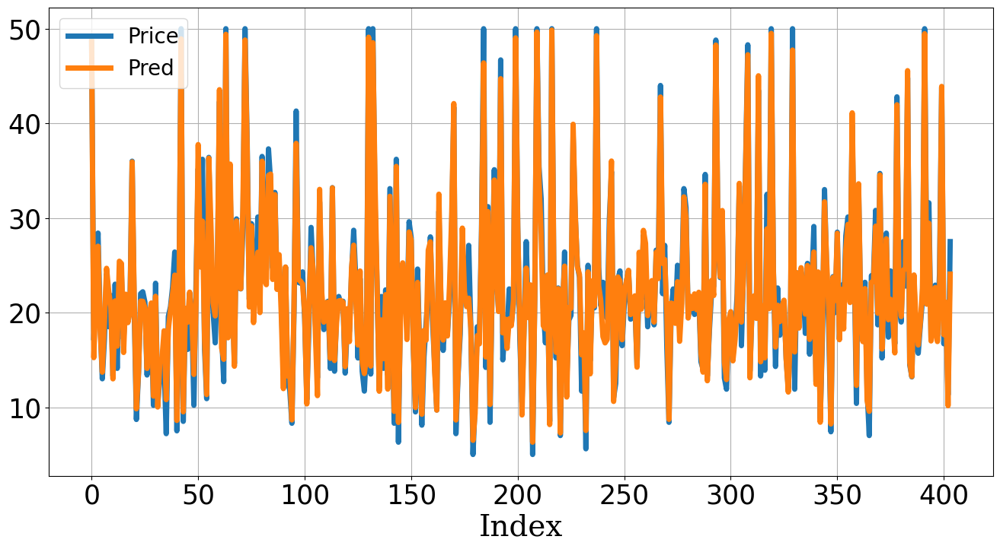

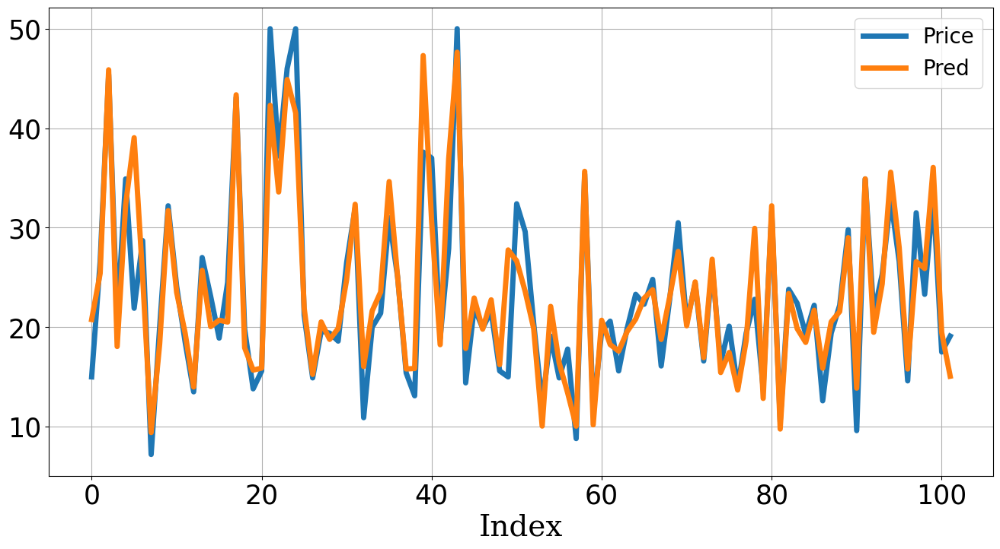

,MAE,MSE,MAPE
Train,1.17,2.33,0.06
Test,2.35,13.00,0.11


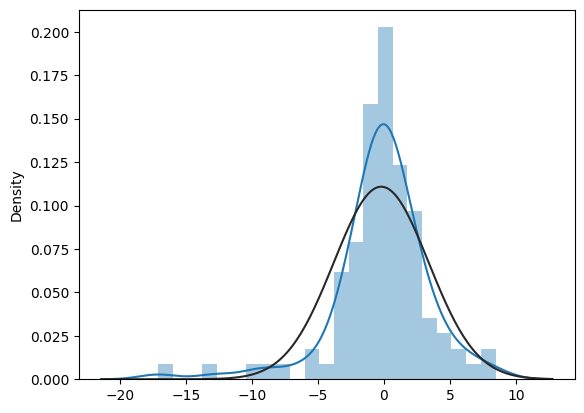

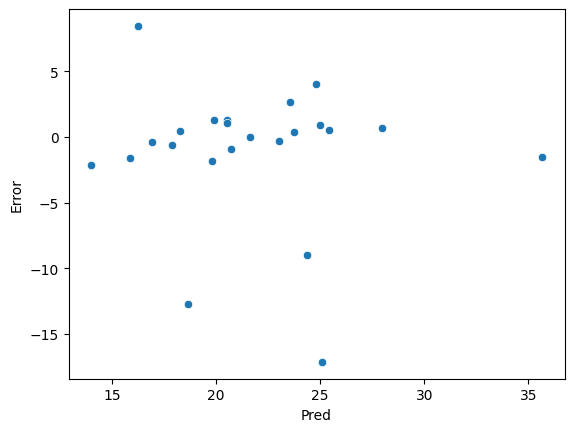

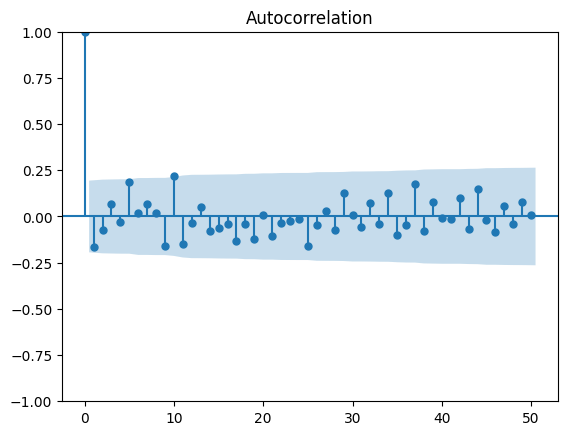

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.89,0.21,17.08,58.05
p-value,0.00,0.00,0.07,0.20
Alternative,NaN,two-sided,NaN,NaN


In [7]:
# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# XGBoost
model_xgb = XGBRegressor(n_estimators=100,
                         learning_rate=0.1,
                         max_depth=3, random_state=123)
model_xgb.fit(X_train_fes, Y_train)

Y_trpred = pd.DataFrame(model_xgb.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model_xgb.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_rf = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_rf)

# 에러 분석
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Multi-Layered Perceptron

**1) 방향:** 인공신경망의 `비선형성 접근 필요성`으로  `은닉층`을 반영항 `다층/심층신경망으로 딥러닝을 출발시킴`

- `2개의 직선` 또는 `여러개의 직선이 결합된 1개의 곡선`을 이용하여 제대로 분류가 가능할 것이라 가정
- `다층(여러개의 직선)신경망`으로 비선형 문제를 해결 (Hinton, 1986)  

<center><img src='Image/Expert/DL_Compare_MLP.jpg' width='500'></center>

- 여러문제가 해결되면서 `은닉층을 늘려 학습 결과를 향상`시키는 방법이 등장하며 `DNN(Deep Neural Network)`라고 함

<center><img src='Image/Expert/DL_ANN_MLP.bmp' width='600'>(https://4ir.kisti.re.kr/)</center>

- 은닉층의 수가 증가하면 더욱 어려운 문제를 풀수 있는데, 통상 `은닉층을 최소 2개이상 가진 알고리즘`을 `딥러닝(Deep Learning)` 알고리즘 이라고 함

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

**2) 한계:** 층(Layer)의 수가 많아지면서 `늘어나는 Weights를 수동으로 학습하기에 한계`가 있기에 여전히 데이터 학습 불가

(404, 13) (404, 1)
(102, 13) (102, 1)


I0000 00:00:1743957211.151960  526644 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5520 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,753 (42.00 KB)

 Trainable params: 10,753 (42.00 KB)

 Non-trainable params: 0 (0.00 B)

I0000 00:00:1743957212.717582  526903 service.cc:148] XLA service 0x7f85d0005660 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743957212.717619  526903 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2025-04-07 01:33:32.733609: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1743957212.798943  526903 cuda_dnn.cc:529] Loaded cuDNN version 90600
I0000 00:00:1743957213.795895  526903 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


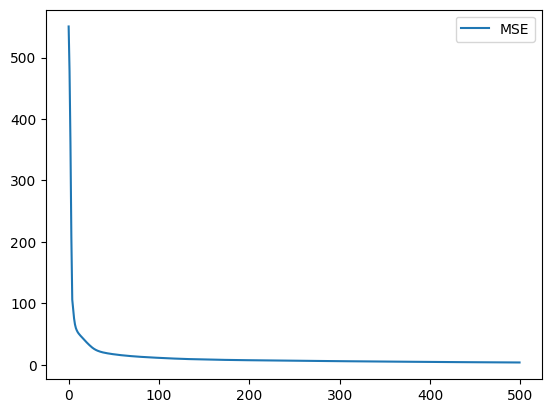

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step


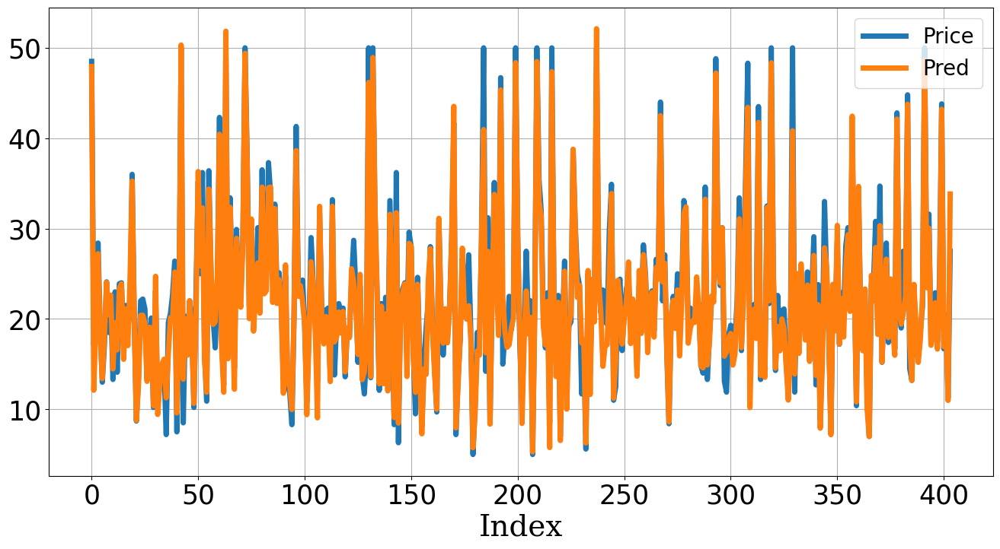

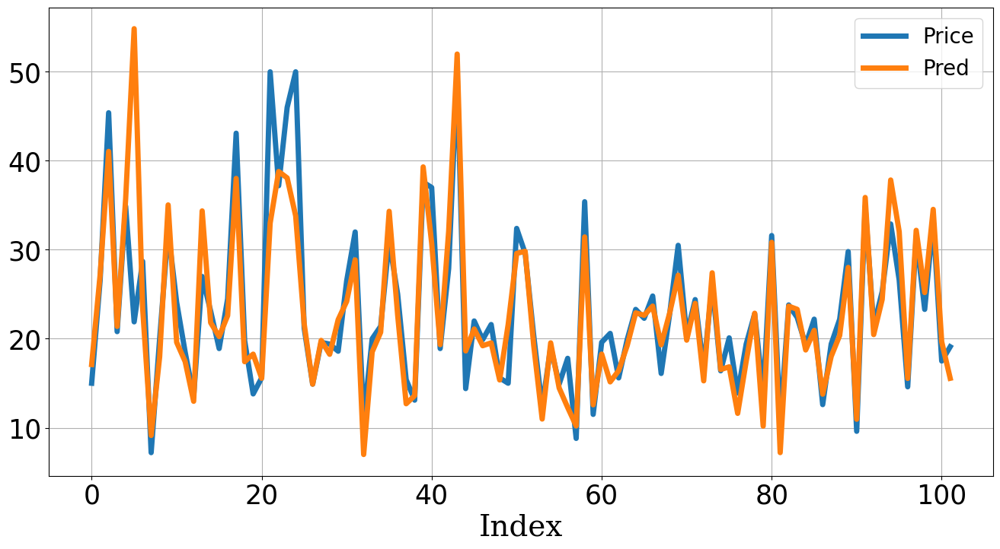

,MAE,MSE,MAPE
Train,1.42,3.98,0.07
Test,2.64,23.20,0.12


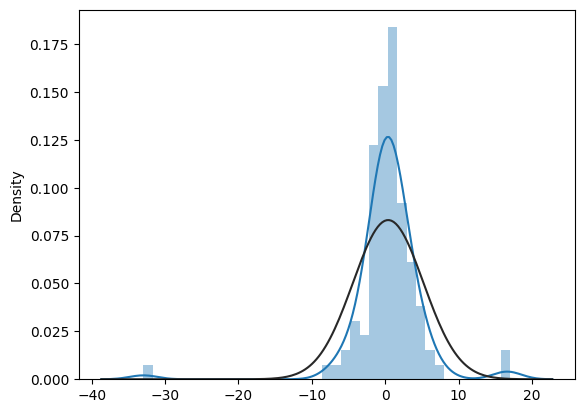

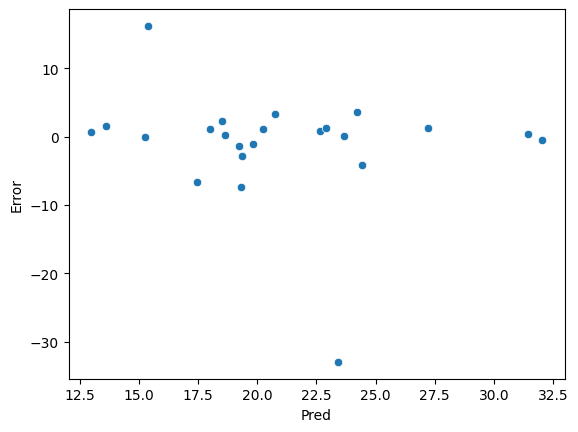

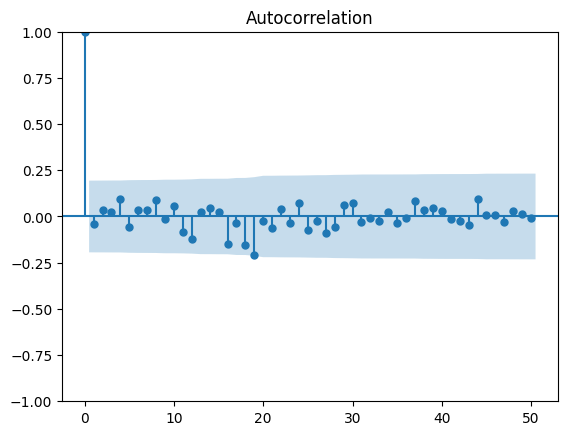

,Normality,Heteroscedasticity,Autocorr(lag10),Autocorr(lag50)
Test Statistics,0.70,0.09,3.25,28.29
p-value,0.00,0.00,0.97,0.99
Alternative,NaN,two-sided,NaN,NaN


In [8]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
LOSS = 'mse'
OPTIMIZER = 'adam'
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)


# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])


# 분석 검증
Score_nn = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn)

# 에러 분석
Resid_te = Y_test - Y_tepred.values
Resid_te.columns = ['Error']

Error_te = error_analysis(X_test_fes, Y_tepred, Resid_te, graph_on=True)
display(Error_te)

## Comparison of Modeling Codes

```python
# Linear Regression
model_lr = sm.OLS(Y_train, X_train_fes).fit()

# Random Forest
model_rf = RandomForestRegressor(n_estimators=100, random_state=123)
model_rf.fit(X_train_fes, Y_train)

# XGBoost
model_xgb = XGBRegressor(n_estimators=100,
                         learning_rate=0.1,
                         max_depth=3, random_state=123)
model_xgb.fit(X_train_fes, Y_train)

# MLP
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  

model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
```

# **Performance Update**

> **"(1) `실제 데이터`에 머신러닝과 딥러닝 알고리즘으로 데이터분석 프로세스를 완성하고,"**
>
> **"(2) `딥러닝 알고리즘의 한계점을 보완`하기 위해 `Vanishing Gradient 이슈, 과적합 이슈, 하이퍼파라미터 최적화 등`으로 개선"**
>
> - **하이퍼파라미터 튜닝:** 실행마다 결과는 달라질 수 있고 `비용함수를 수동으로 최소로 만드는 것`
> - **인공지능 개발:** 하이퍼파라미터 튜닝으로 `낮은 비용함수와 높은 예측성능`을 획득 하는 것

## Learning Rate

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,753 (42.00 KB)

 Trainable params: 10,753 (42.00 KB)

 Non-trainable params: 0 (0.00 B)

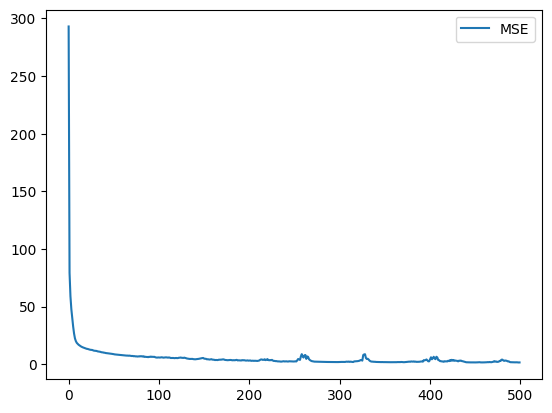

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


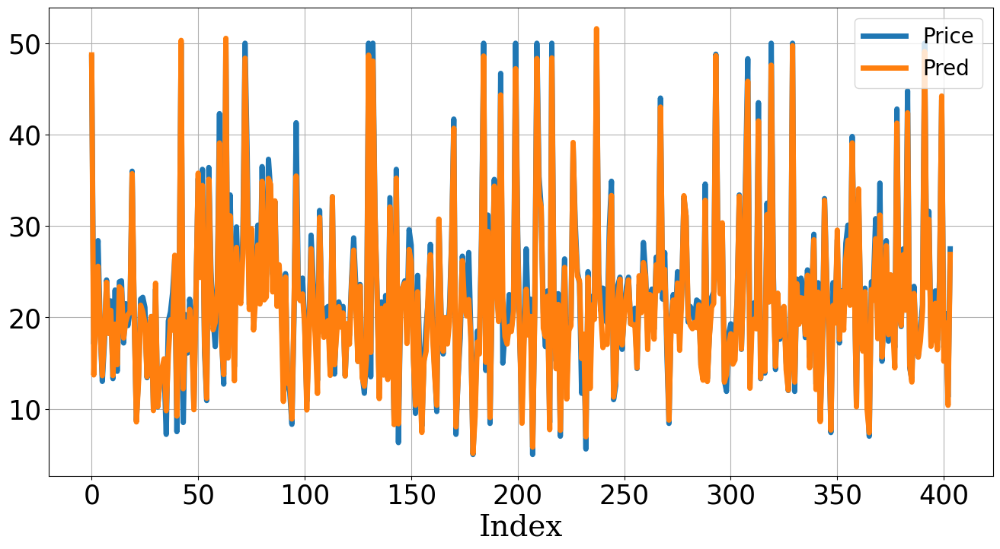

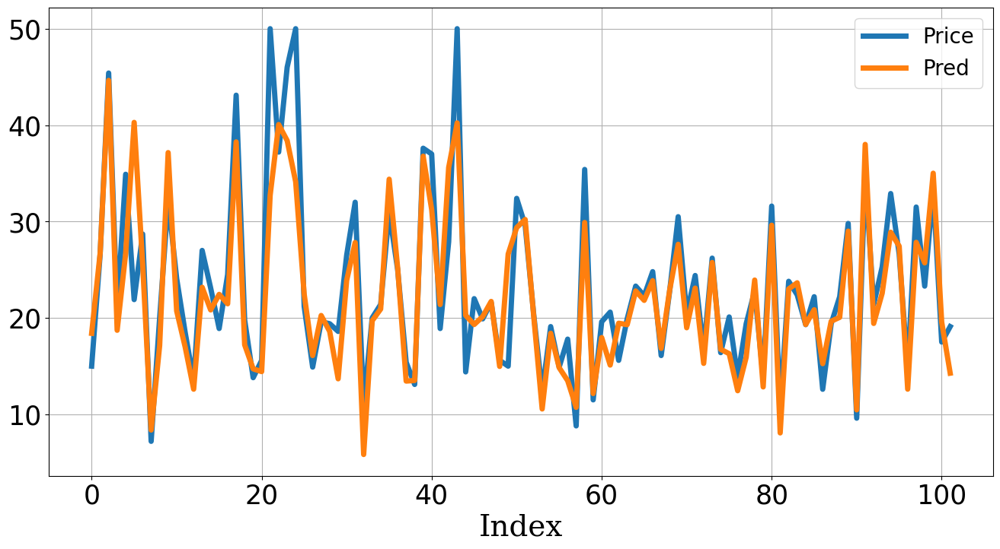

,MAE,MSE,MAPE
Train,1.09,2.15,0.05
Test,2.82,18.79,0.12


In [9]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)    # OPTIMIZER = 'adam'
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)


# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])


# 분석 검증
Score_nn = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn)


## Increasing Hidden Layers

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

2025-04-07 01:34:56.333169: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_430', 68 bytes spill stores, 72 bytes spill loads

2025-04-07 01:34:56.431764: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_430', 24 bytes spill stores, 24 bytes spill loads

2025-04-07 01:34:57.895707: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_430', 24 bytes spill stores, 28 bytes spill loads

2025-04-07 01:34:58.150323: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_430', 24 bytes spill stores, 24 bytes spill loads



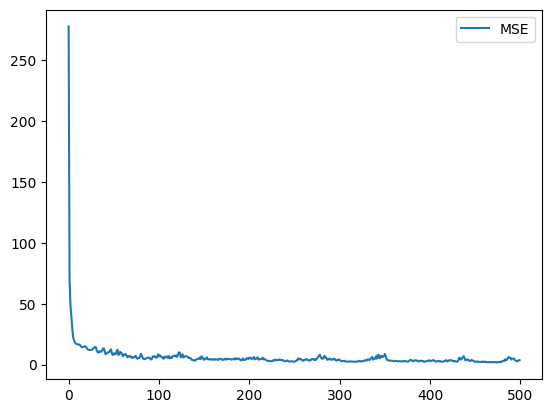

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 294ms/step


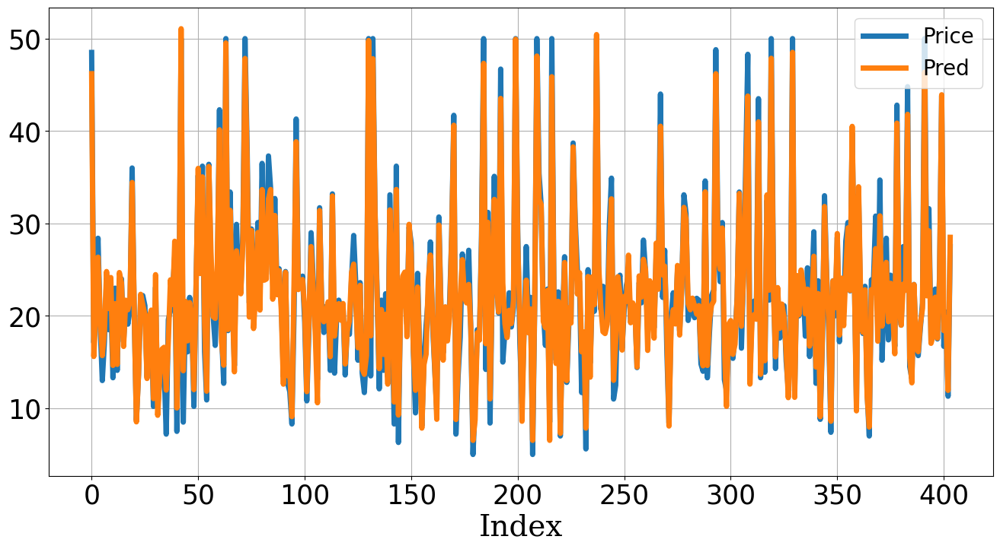

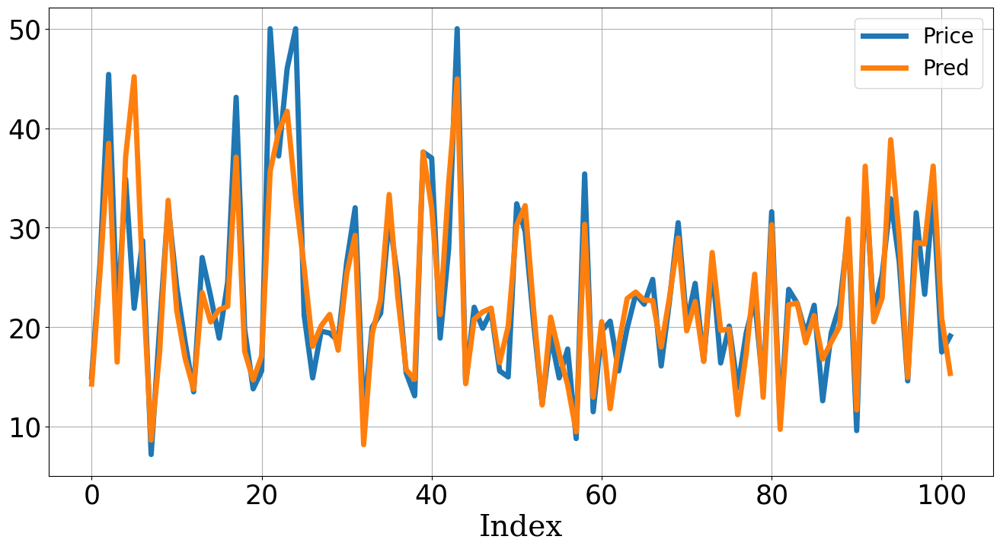

,MAE,MSE,MAPE
Train,1.31,2.93,0.07
Test,2.66,17.59,0.11


In [10]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)


# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_deep = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_deep)


## Regularization

**1) Regularization:** `비용함수를 개선`하여 과적합 낮춤

> **"`추정 가중치가 커지면` 활성함수를 통해 `기울기가 급변`하게되어 비용함수 최소화가 어렵고 `과적합 높아짐`"**   
>
> **(0) Linear Regression:** `MSE`를 비용함수로 사용
>
> <center> $\hat{w} = \underset{w}{\arg\min} \Biggl[\displaystyle \sum_{j=1}^t \Bigl(y_j - \displaystyle \sum_{i=0}^k w_i x_{ij}\Bigr)^2\Biggr]$ </center>
>
> **(1) L1 Panelty:** `LASSO Regression`에 사용한 비용함수 반영    
>
> \begin{align*}
\hat{w} = \underset{w}{\arg\min} \Biggl[\displaystyle \sum_{j=1}^t \Bigl(y_j - \displaystyle \sum_{i=0}^k w_i x_{ij}\Bigr)^2 + \lambda \displaystyle \sum_{i=0}^k \left|w_i \right|\Biggr] \\ where~\lambda~is~hyper~parameter(given~by~human)
\end{align*}
>
> - `중요도가 낮은 변수`의 가중치는 0으로 출력하여 과적합 방지
> - `변수선택 효과`가 있어 모델 복잡도를 효과적으로 제약
> - 샘플 수보다 변수가 많더라도 변수선택 효과 때문에 `고차원의 데이터도 적용가능`
> - `패널티의 정도`는 Hyperparameter로 사전 결정되며 교차검증이나 유사 방법으로 결정
> - `모델에 제약`을 주며 정확도를 상승시킴   
>
> **(2) L2 Panelty:** `Ridge Regression`에 사용한 비용함수 반영   
>
> \begin{align*}
\hat{w} = \underset{w}{\arg\min} \Biggl[\displaystyle \sum_{j=1}^t \Bigl(y_j - \displaystyle \sum_{i=0}^k w_i x_{ij}\Bigr)^2 + \lambda \displaystyle \sum_{i=0}^k w_i^2\Biggr] \\ where~\lambda~is~hyper~parameter(given~by~human)
\end{align*}
>
> - `모든 가중치`를 일률적으로 `작게 만드는 경향`
> - `중요도 낮은 변수`라도 0이 아닌 가중치를 출력하므로 `일반화 및 변수비교 효과`
> - 일반화 및 패널티 효과를 높이기 위해 `L1 보다 L2를 많이 사용하는 경향`

<center><img src='Image/Expert/DL_CF_L1L2.png' width='600'></center>

<center><img src='Image/Expert/DL_CF_L1L2_Compare.png' width='600'></center>
<!-- (https://kevinthegrey.tistory.com/110) -->

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

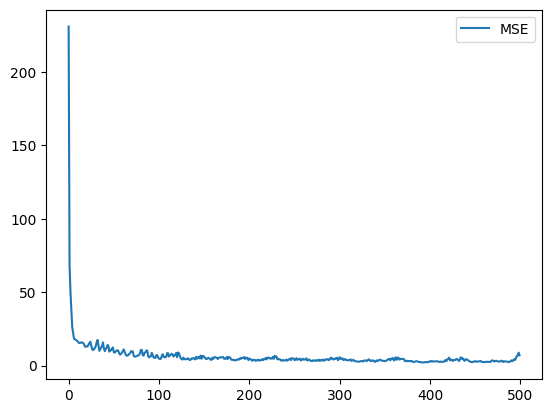

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


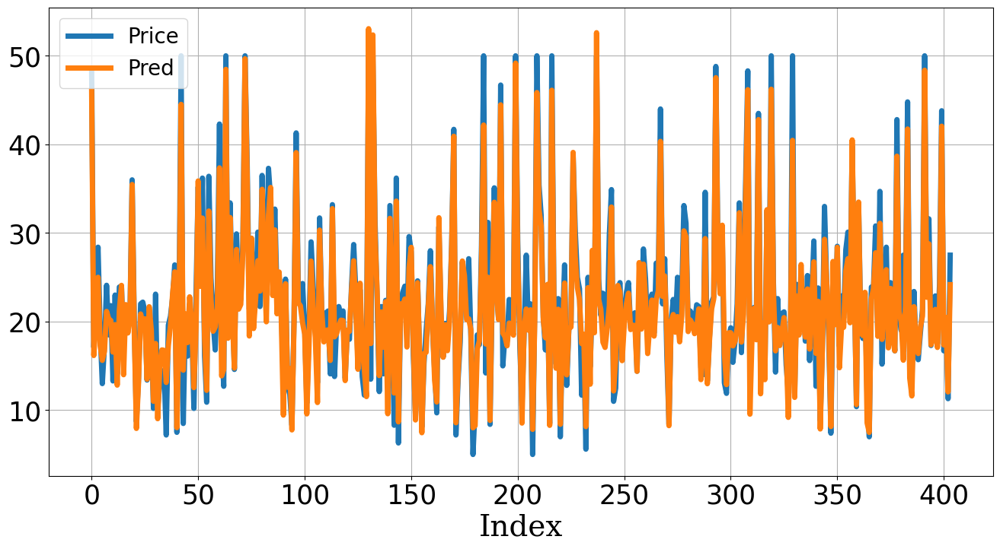

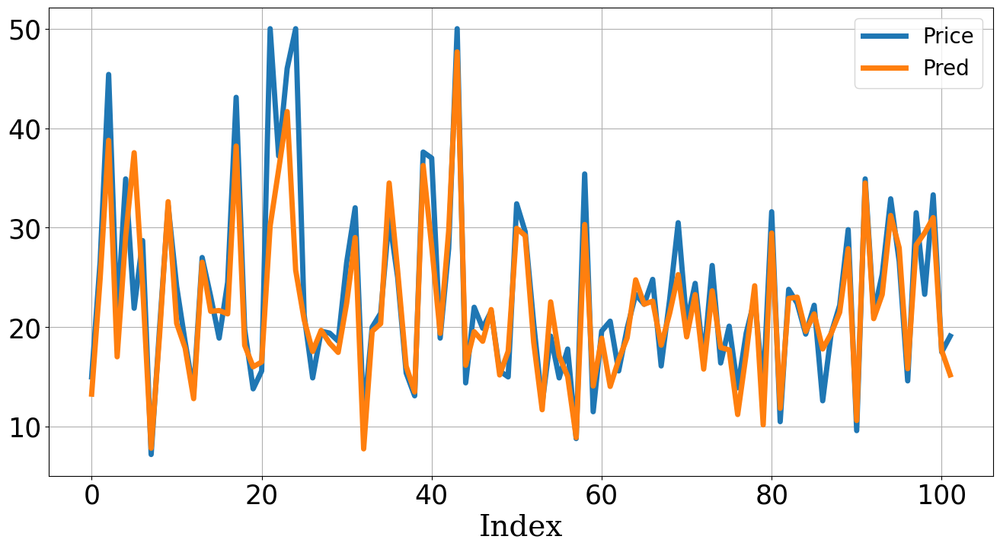

,MAE,MSE,MAPE
Train,1.73,5.36,0.09
Test,2.55,18.82,0.11


In [11]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)


# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_regul = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_regul)


## Drop Out

**2) Drop Out:** 각 `batch마다` 은닉층의 `일부 뉴런을 무작위 확률로 제외(출력을 0으로 변환)`하면서 학습 

> **"`모든 직원`이 함께 일하는 것 < `소그룹`의 결과를 통합하는 것 $\rightarrow$ 더욱 효율적일수도"**    
>
> **"각 단계의 줄어든 뉴런은 약한 학습이지만 `약한 모델들이 합쳐져 강력한 예측력`"**   
>
> - `Labeled 데이터의 부족`과 `Overfitting 문제 해결`을 위해 Drop Out 제안 (Hinton et al. 2012)
> - 학습할 때마다 `일부 유닛만을 사용하고 이를 반복해서 합치는 방식`으로 `Ensemble과 유사`
> - 빠진 뉴런들로 예측 하기에 `여러개의 국소적 독립적 내부패턴 학습가능`
> - 네트워크가 `뉴런의 특정 가중치에 덜 민감해짐`
> - `더욱 일반화에 기여가 가능`하고 훈련 데이터에만 과적합 가능성 적어짐
> - 너무 낮은 비율은 효과가 적고 너무 높은 비율은 과소적합 하기에 `20~50% 권장`
> - 일반적으로 `Learning Rate(LR, 10->100)과 Momentum(0.9 or 0.99)을 높여 사용`
> - LR을 높여 가중치의 크기를 줄이면 Ridge와 유사하게 `과적합이 줄어 높은 성능`

<center><img src='Image/Expert/DL_DropOut.png' width='500'></center>
<!-- (https://t1.daumcdn.net/cfile/tistory/99324B335D383CBD1B) -->

> - 랜덤한 뉴런을 제거하는 것 대신, `연결선을 랜덤하게 제거하는 DropConnect 방법(별도 외장함수)`도 존재 (Wan et al. 2013)
> - Dropout을 Dropconnect로 표현할 수 있지만, `Dropconnect를 Dropout으로 표현하기 어려움`
> - `특정 노드를 비활성화` = `특정 노드에 연결된 모든 가중치를 비활성화`

<center><img src='Image/Expert/Dropout_Dropconnect.png' width='500'>(https://stats.stackexchange.com/questions/201569/what-is-the-difference-between-dropout-and-drop-connect)</center>

---

> - 성능변화 예시:

<center><img src='Image/Expert/DL_Dropout_Dropconnect.png' width='700'></center>

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

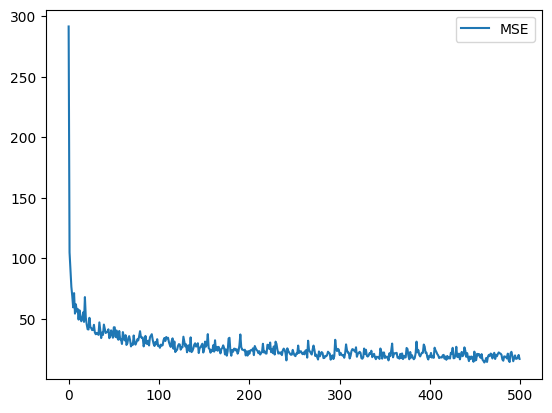

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


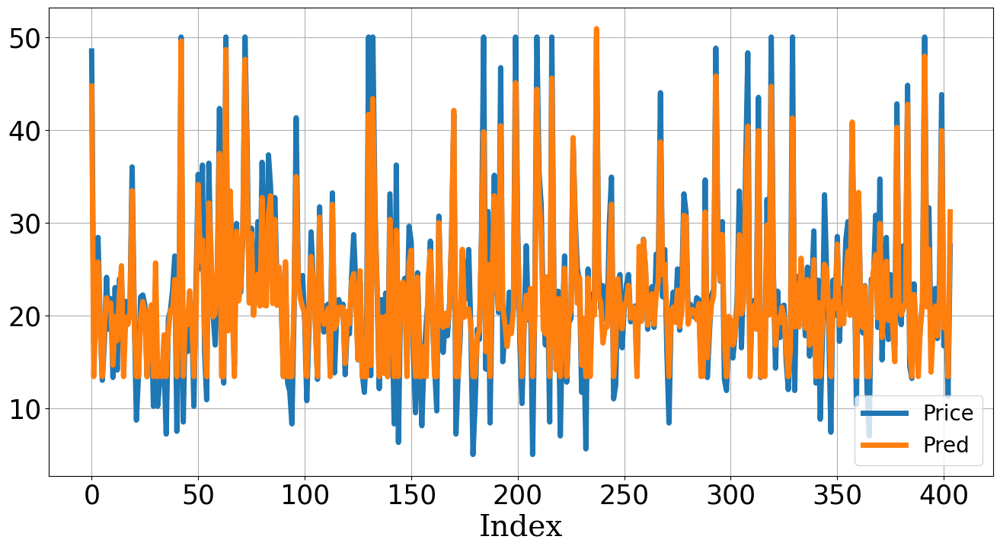

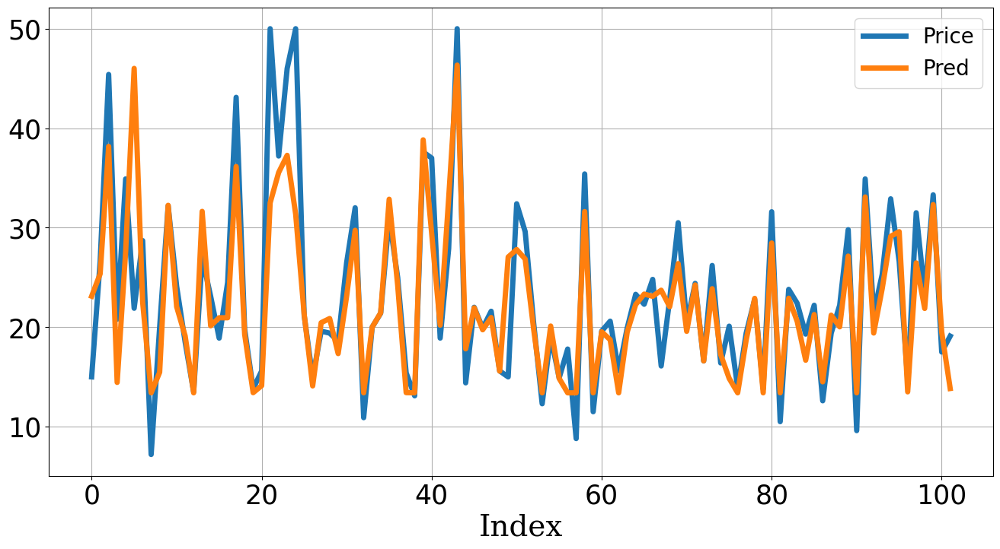

,MAE,MSE,MAPE
Train,2.07,7.96,0.12
Test,2.99,23.45,0.14


In [12]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)


# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_dropout = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_dropout)


## Early Stopping

**3) Early Stopping:** Test 에러가 빠르게 증가하는 경우 `계속 학습하지 않고 일찍 종료`하는 방법   

> **"데이터가 Train/Validation/Test로 구분되어 있을때, `Validation/Test의 비용함수가 낮으면 멈추므로 Train을 계속 학습하는 과적합 가능성 낮춤`"**   

<center><img src='Image/Expert/DL_Overfitting_Epoch.png' width='600'></center>

<center><img src='Image/Expert/DL_Overfitting_EarlyStopping.png' width='600'></center>
<!-- (https://kevinthegrey.tistory.com/110) -->

### Basic

- **콜백(Callbacks):** 학습 과정의 `특정 단계에서 적용할 함수의 세트`로 모델의 `학습 상태와 통계자료 확인 가능`

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 186: early stopping


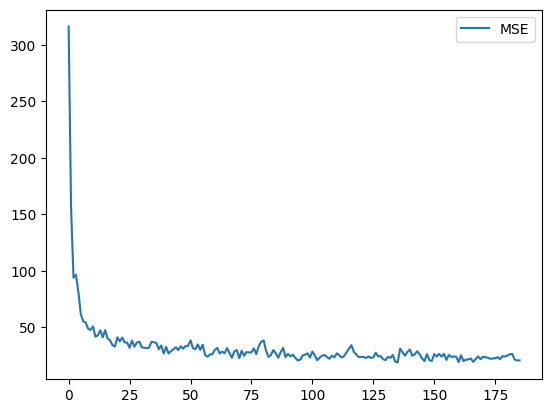

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


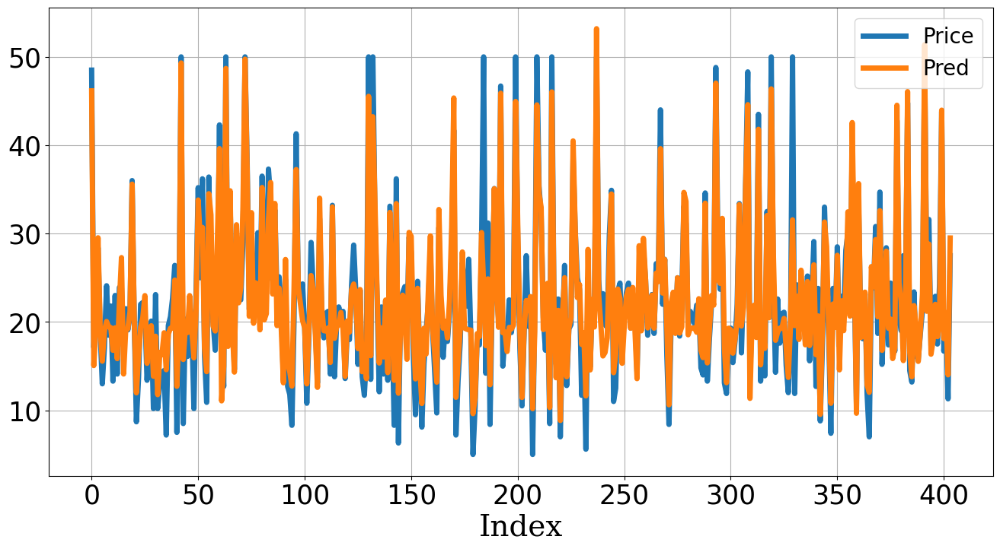

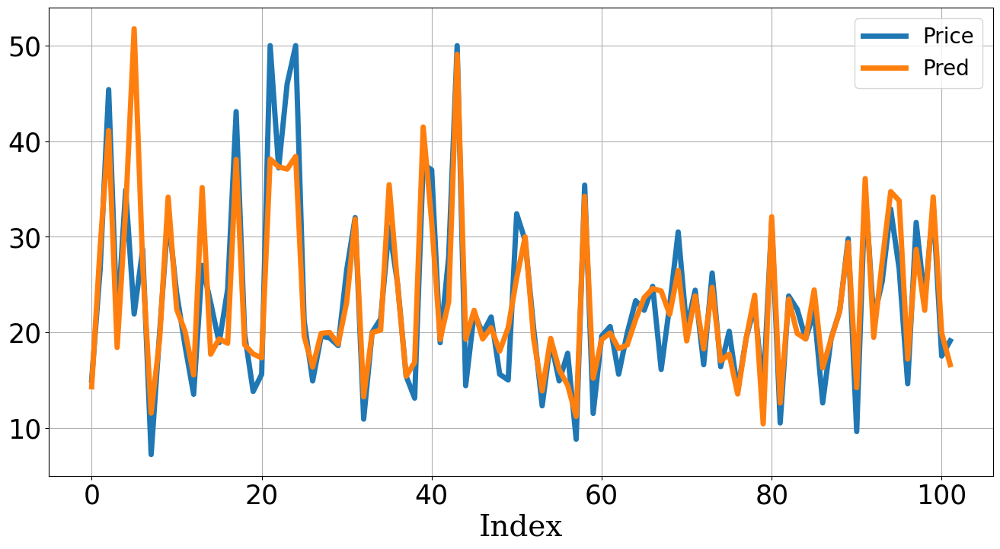

,MAE,MSE,MAPE
Train,2.15,9.42,0.12
Test,2.63,19.88,0.13


In [13]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
CALLBACK = [callbacks.EarlyStopping(monitor='loss', mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1)]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

### Progress Bar

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  45%|███████████████████████████▊                                  | 224/500 [00:22<00:22, 12.06it/s]

Epoch 224: early stopping


Training Progress:  45%|███████████████████████████▊                                  | 224/500 [00:22<00:27, 10.06it/s]


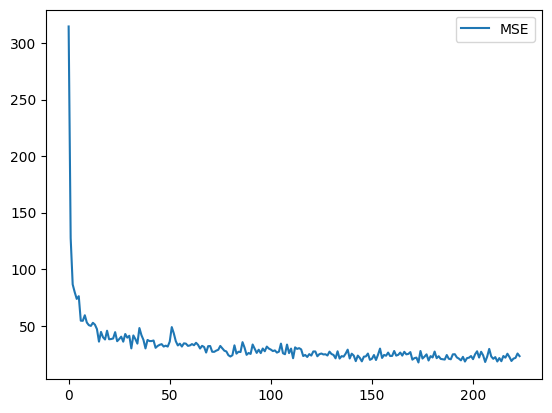

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


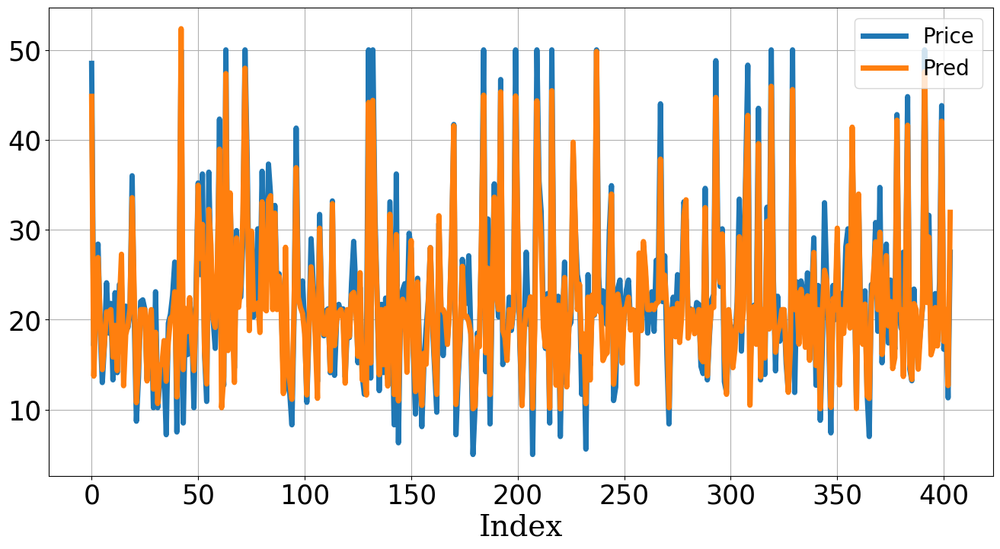

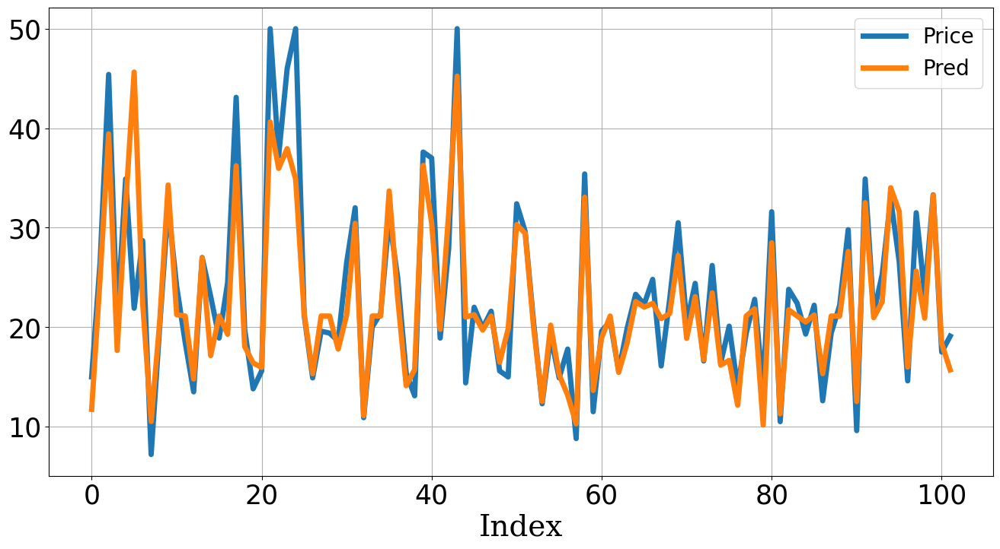

,MAE,MSE,MAPE
Train,2.03,7.23,0.11
Test,2.59,16.50,0.12


In [14]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        """훈련 시작 시 tqdm을 초기화하여 프로그래스 바를 한 줄로 설정"""
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        """매 epoch 종료 후 프로그래스 바를 한 단계씩 업데이트"""
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        """훈련 종료 시 프로그래스 바를 닫습니다."""
        self.epochs_pbar.close()
CALLBACK = [callbacks.EarlyStopping(monitor='loss', mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar()]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

### Best Model Saving

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  36%|██████████████████████▏                                       | 179/500 [00:19<00:25, 12.60it/s]

Epoch 179: early stopping


Training Progress:  36%|██████████████████████▏                                       | 179/500 [00:19<00:35,  9.04it/s]


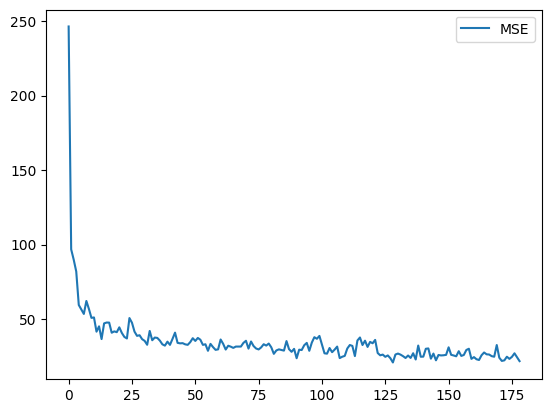

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


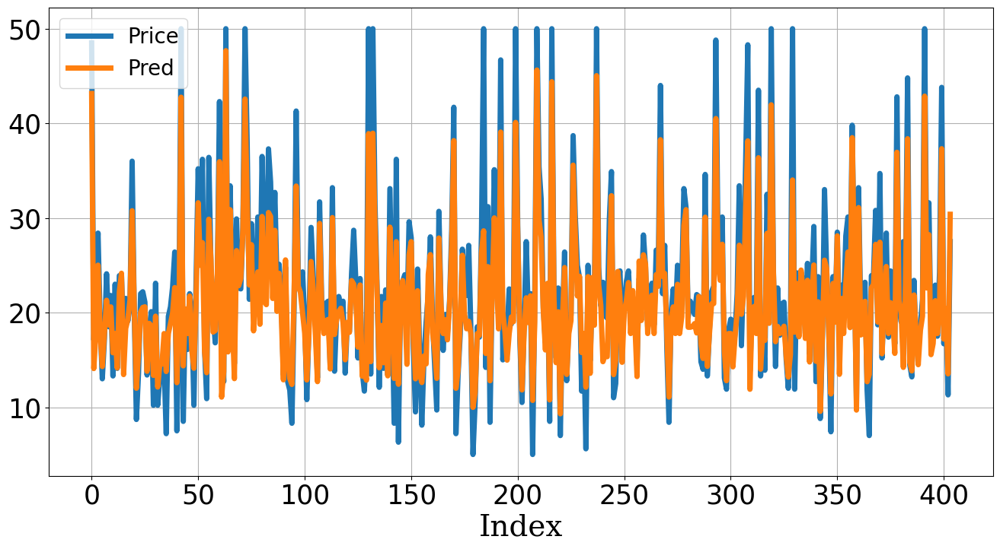

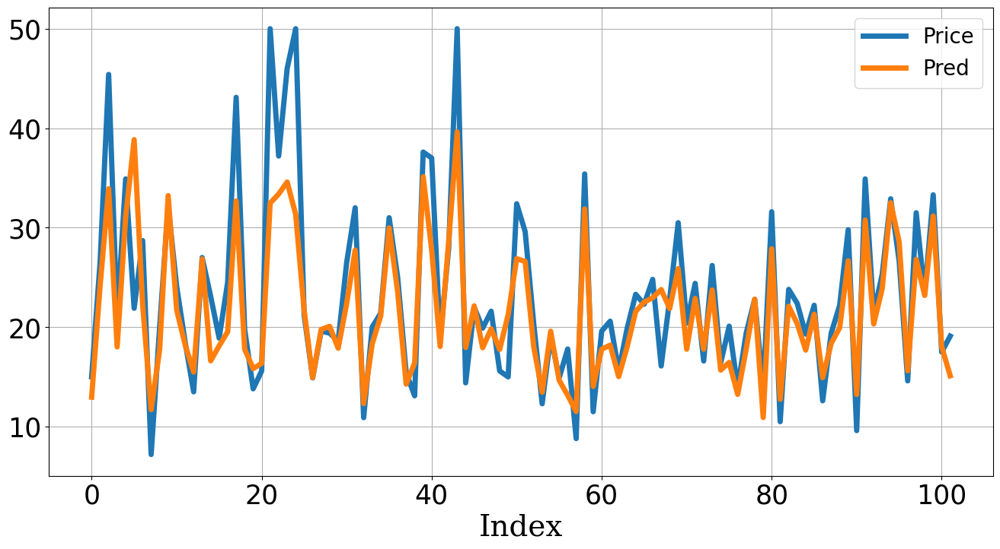

,MAE,MSE,MAPE
Train,2.52,12.47,0.13
Test,3.05,21.60,0.13


In [15]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'loss'
FILENAME = os.path.join(os.getcwd(),'Model','BostonHousing_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

### Best Model Loading and Prediction

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


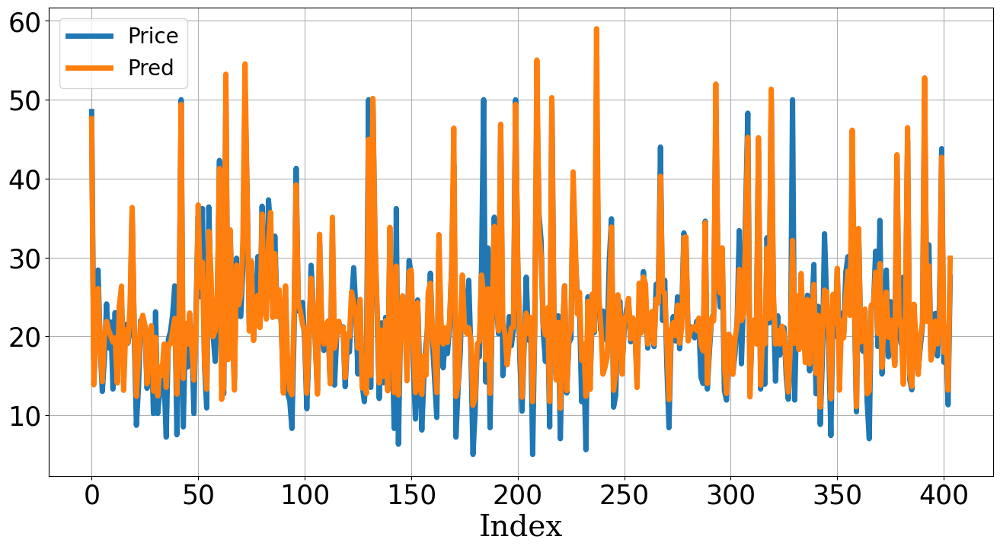

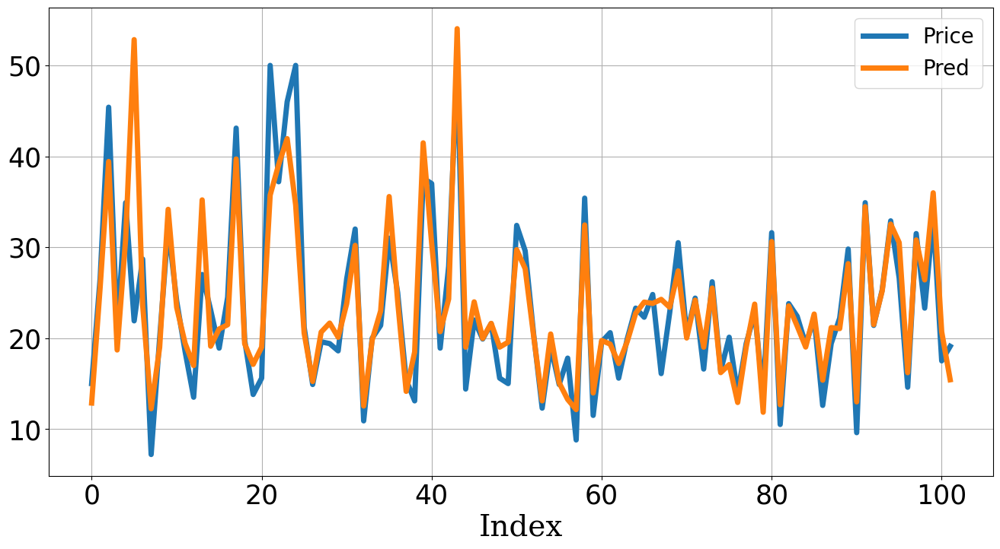

,MAE,MSE,MAPE
Train,2.04,9.19,0.12
Test,2.69,21.21,0.13


In [16]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

### Test Validation

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  71%|████████████████████████████████████████████▎                 | 357/500 [00:57<00:20,  6.84it/s]

Epoch 357: early stopping


Training Progress:  71%|████████████████████████████████████████████▎                 | 357/500 [00:57<00:23,  6.21it/s]


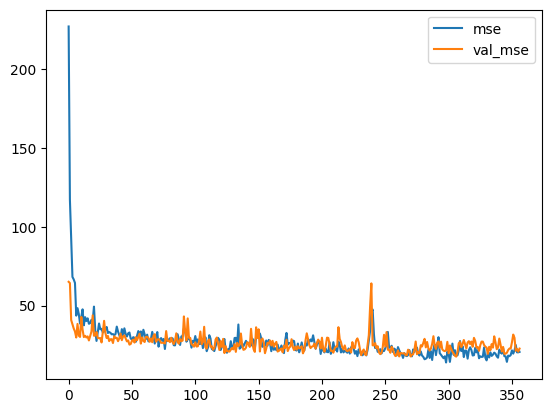

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


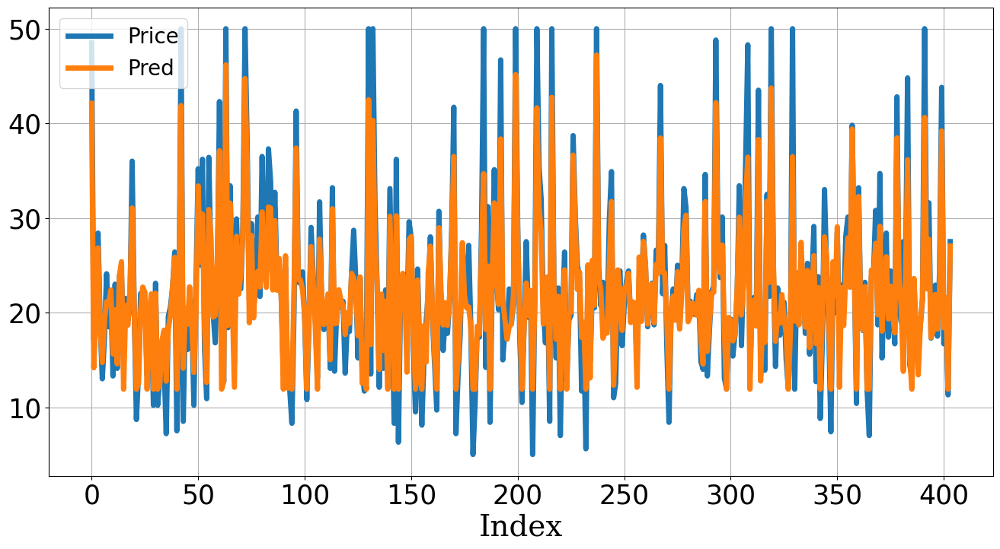

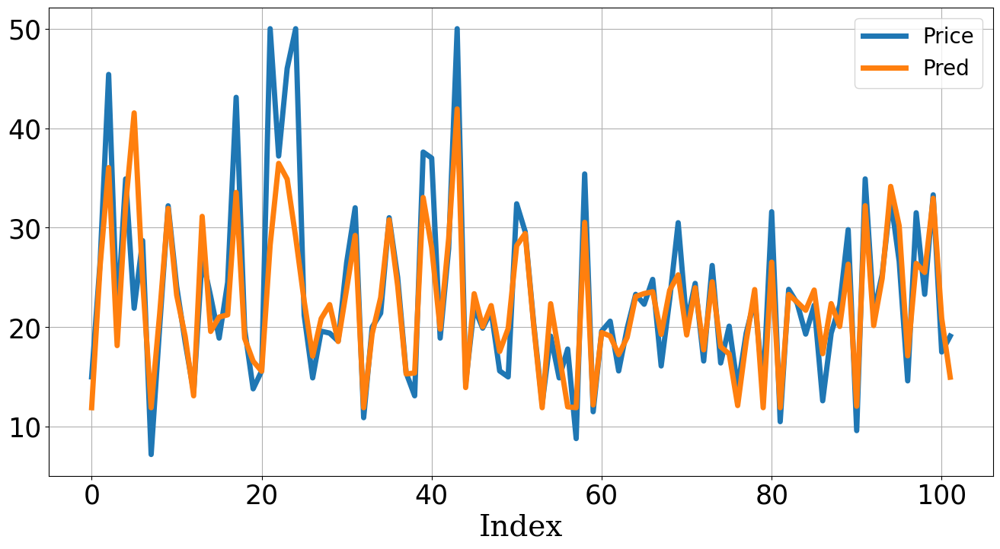

,MAE,MSE,MAPE
Train,2.19,9.71,0.12
Test,2.87,22.65,0.12


In [17]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BostonHousing_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_data=(X_test_fes, Y_test),
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

- `Test 데이터`를 기준으로 성능을 평가하여 Early Stopping 하는 것은 `미래 데이터를 이용`하는 느낌?
- Train 데이터에서 별도 `Validation 데이터를 분리하여 평가에 반영`하는 것이 올바른 방향

<center><img src='Image/Expert/DataSplit_Simple.png' width='500'></center>

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 256)            │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,129 (188.00 KB)

 Trainable params: 48,129 (188.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  64%|███████████████████████████████████████▌                      | 319/500 [00:52<00:24,  7.35it/s]

Epoch 319: early stopping


Training Progress:  64%|███████████████████████████████████████▌                      | 319/500 [00:52<00:29,  6.09it/s]


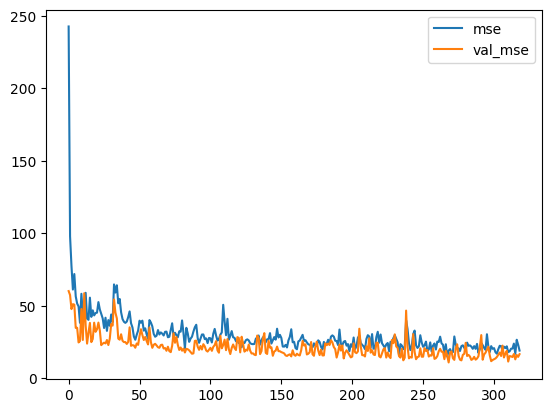

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


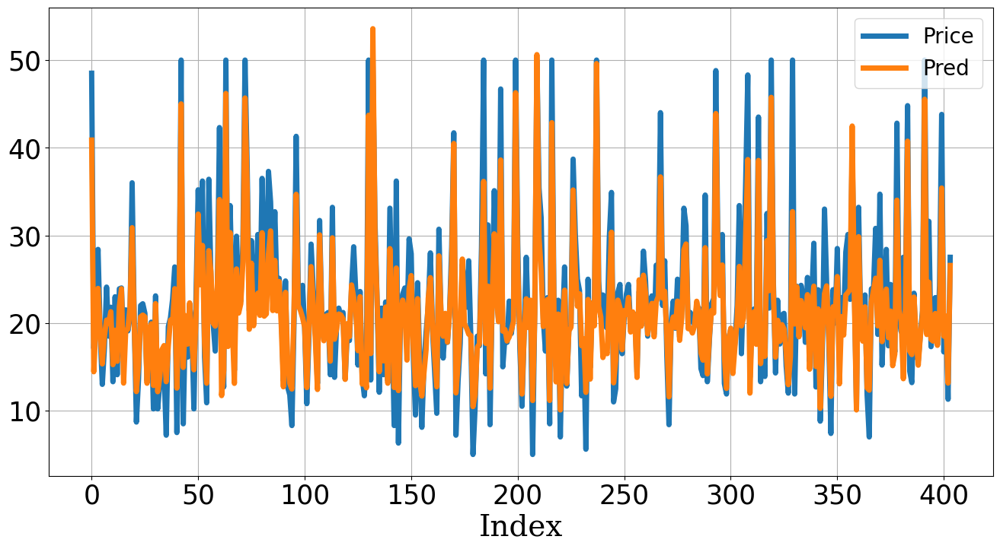

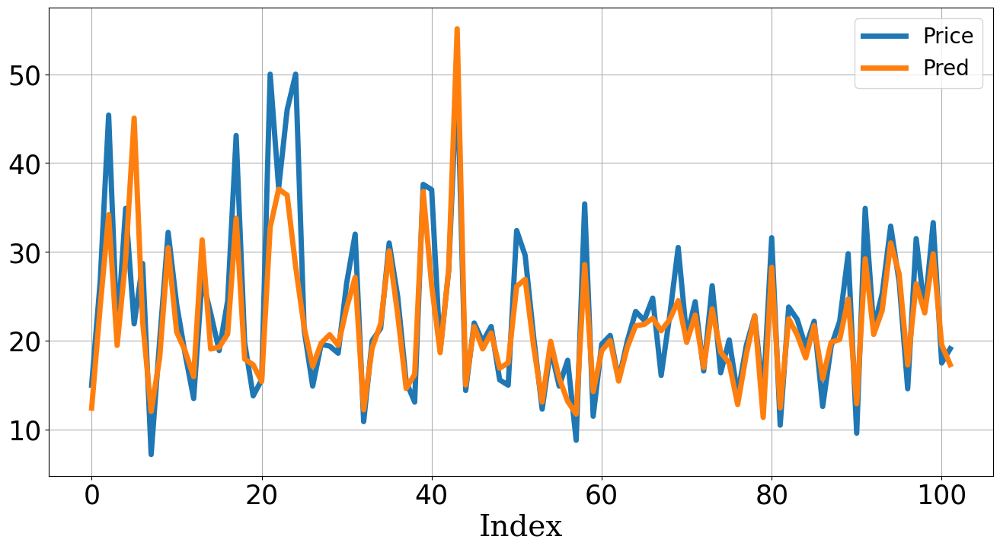

,MAE,MSE,MAPE
Train,2.44,11.52,0.13
Test,2.96,23.73,0.13


In [18]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BostonHousing_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_split=0.2,
#                       validation_data=(X_test_fes, Y_test),
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


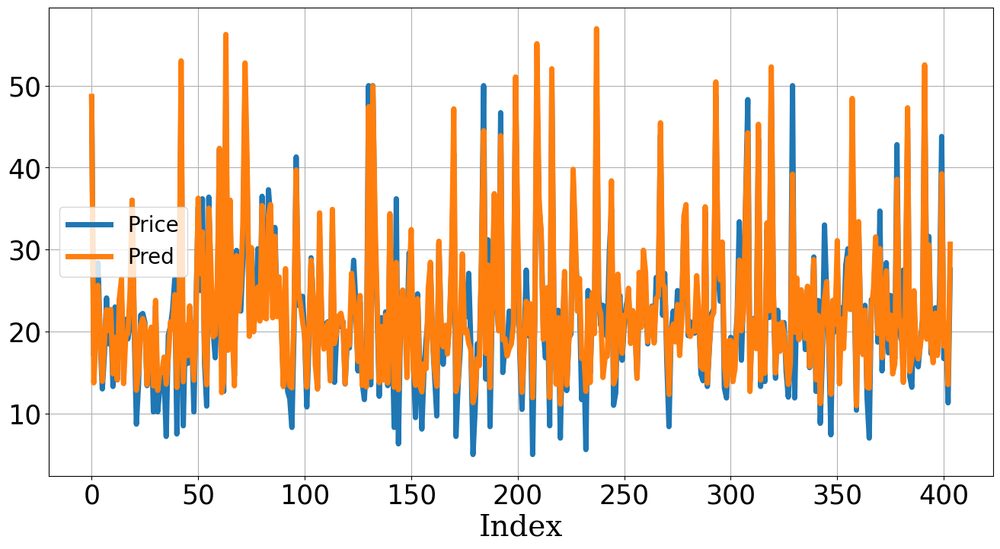

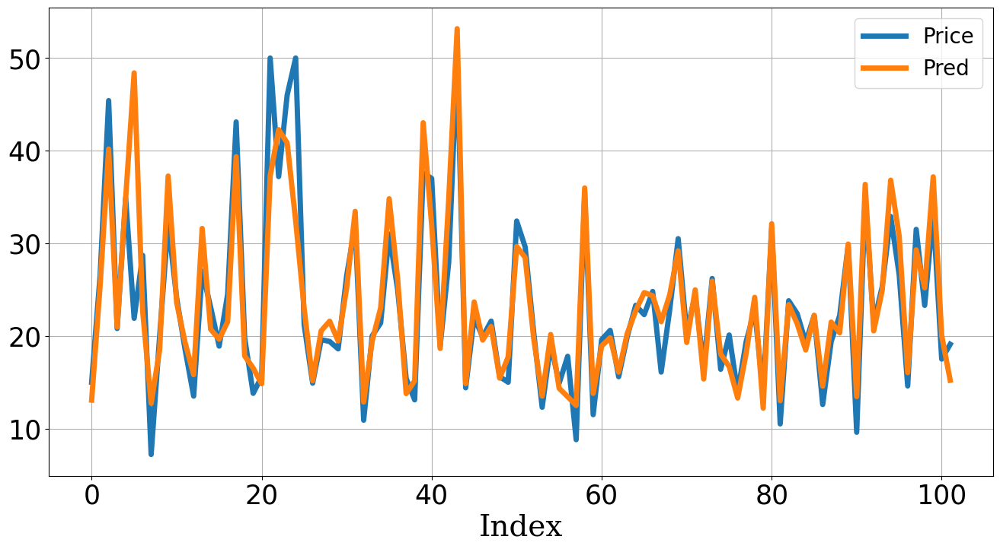

,MAE,MSE,MAPE
Train,1.98,7.40,0.12
Test,2.48,17.83,0.11


In [19]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Wide and Deep Architecture

<center><img src='Image/Expert/Recommendation_AlgorithmHistory.png' width='800'></center>

> - [K. Kim et al.: DUSIN Modeling for CTR Prediction of Online Advertising (2021)](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=9316682)

---

> **"Wide & deep은 `2016년 구글`이 발표한 논문으로, `Memorization과 Generalization을 동시에` 수행할 수 있는 `추천시스템 모델`이며 `구글 플레이스토어`의 추천시스템에 활용되어 매우 효율적이며 효과적인 성능"**

<center><img src='Image/Expert/WideDeep.png' width='1000'>(Chen et al., 2016 Wide & deep learning for recommender systems. CoRR, abs/1606.07792, 2016.)</center>

### Simple Version

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 18)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_46 (Dense)    │ (None, 256)       │      4,864 │ input_layer_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_24          │ (None, 256)       │          0 │ dense_46[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_47 (Dense)    │ (None, 128)       │     32,896 │ dropout_24[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_25          │ (None, 128)       │          0 │ dense_47[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_48 (Dense)    │ (None, 64)        │      8,256 │ dropout_25[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_26          │ (None, 64)        │          0 │ dense_48[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_49 (Dense)    │ (None, 32)        │      2,080 │ dropout_26[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_27          │ (None, 32)        │          0 │ dense_49[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 50)        │          0 │ input_layer_10[0… │
│ (Concatenate)       │                   │            │ dropout_27[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_50 (Dense)    │ (None, 1)         │         51 │ concatenate[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 48,147 (188.07 KB)

 Trainable params: 48,147 (188.07 KB)

 Non-trainable params: 0 (0.00 B)

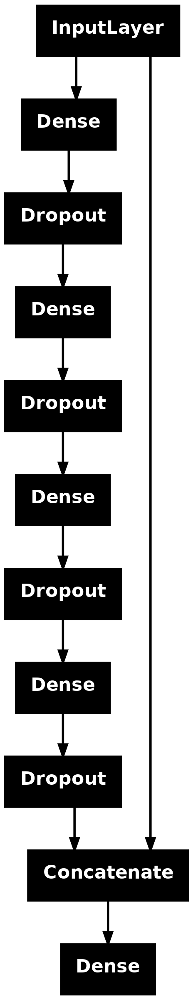

Training Progress:  39%|████████████████████████▍                                     | 197/500 [00:32<00:41,  7.34it/s]

Epoch 197: early stopping


Training Progress:  39%|████████████████████████▍                                     | 197/500 [00:32<00:49,  6.09it/s]


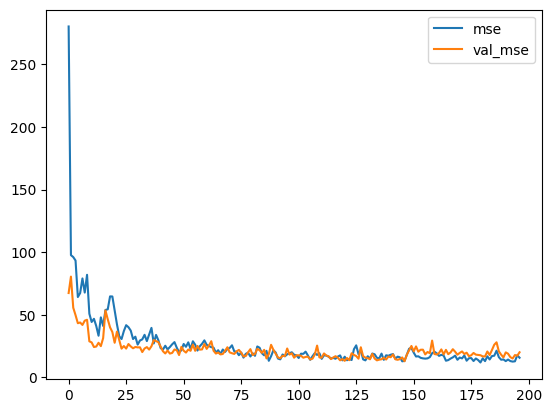

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


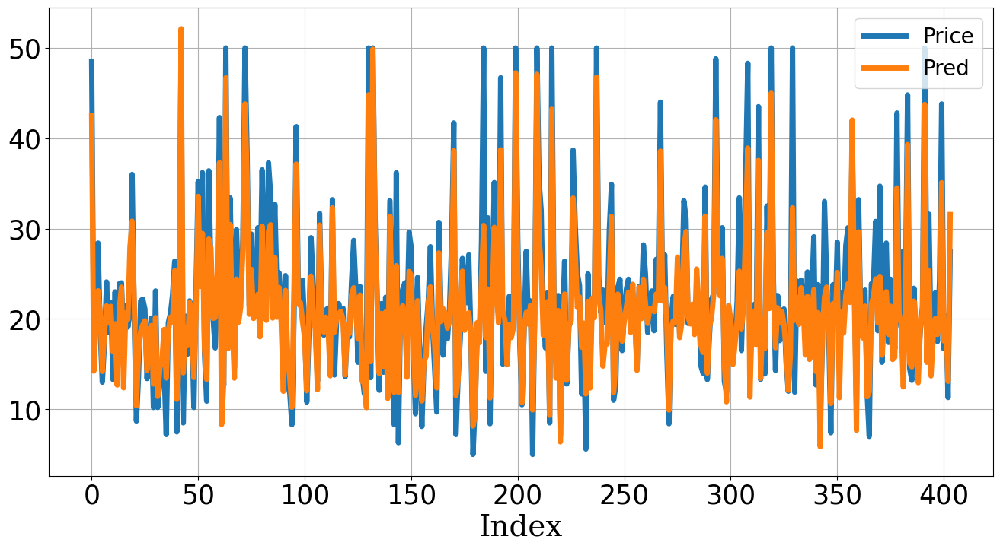

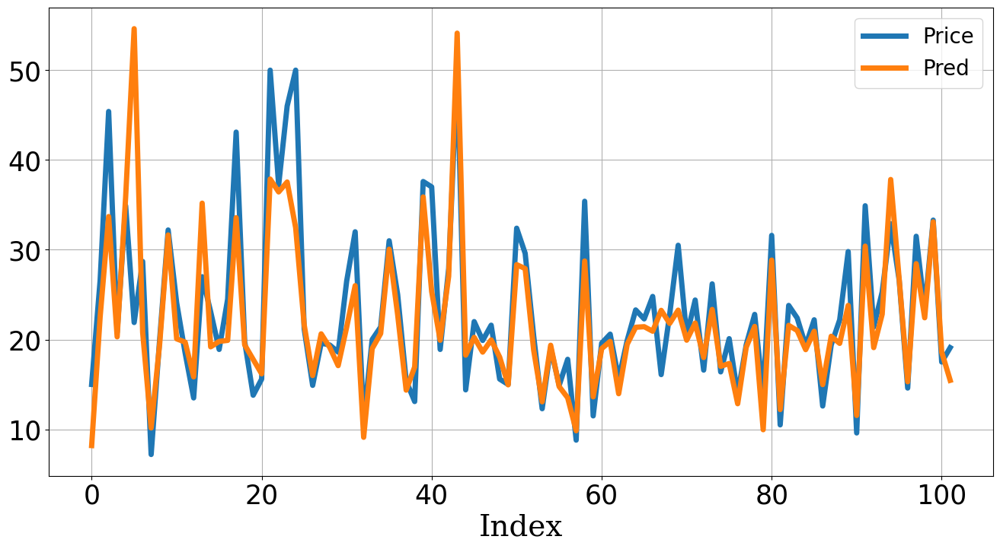

,MAE,MSE,MAPE
Train,2.66,13.19,0.13
Test,3.11,27.44,0.13


In [20]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BostonHousing_WideDeep.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = concatenate([inputs, hiddens])
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
display(plot_model(model))

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


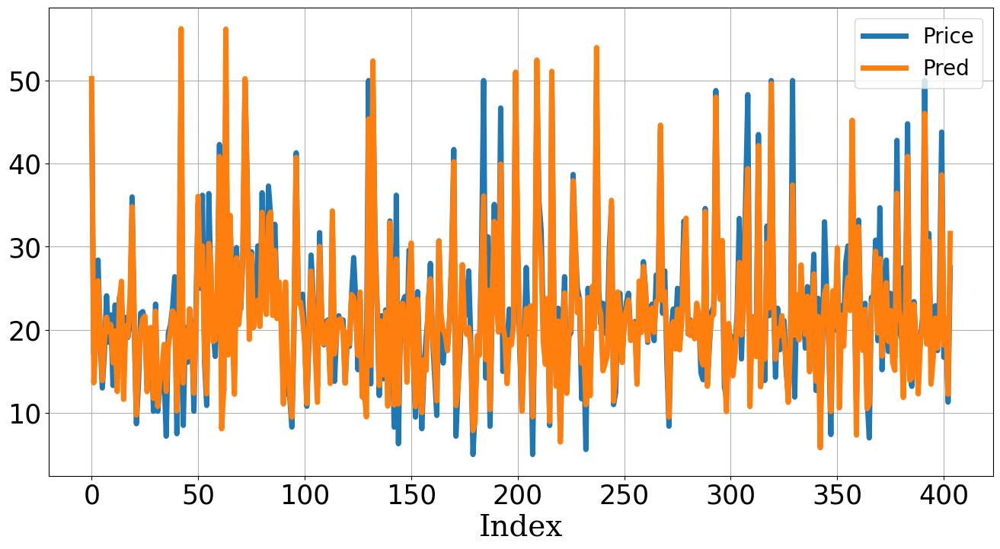

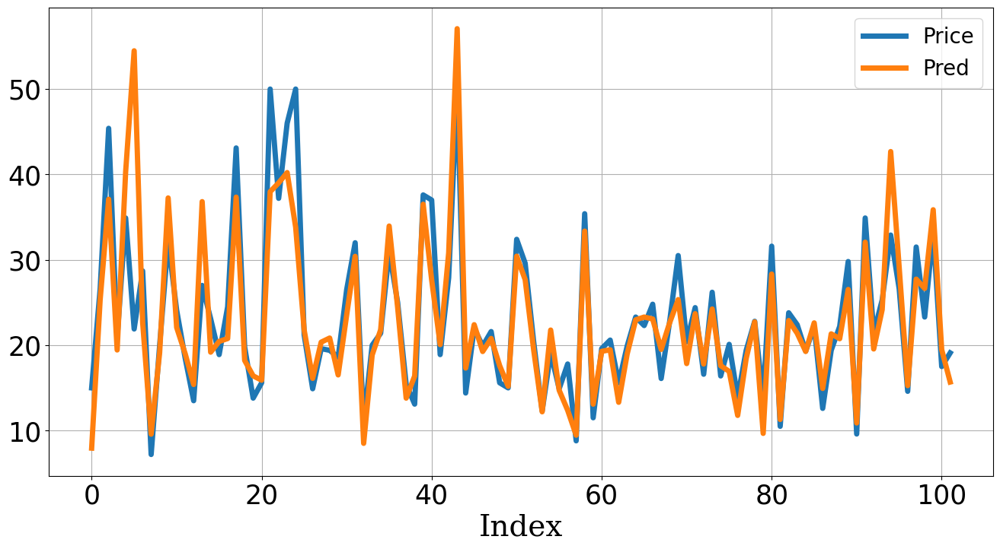

,MAE,MSE,MAPE
Train,1.95,7.82,0.10
Test,2.88,24.15,0.12


In [21]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

### Customized Version

(404, 13) (404, 1)
(102, 13) (102, 1)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 18)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_51 (Dense)    │ (None, 256)       │      4,864 │ input_layer_12[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_28          │ (None, 256)       │          0 │ dense_51[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_52 (Dense)    │ (None, 128)       │     32,896 │ dropout_28[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_29          │ (None, 128)       │          0 │ dense_52[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_53 (Dense)    │ (None, 64)        │      8,256 │ dropout_29[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_30          │ (None, 64)        │          0 │ dense_53[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_54 (Dense)    │ (None, 32)        │      2,080 │ dropout_30[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_11      │ (None, 18)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_31          │ (None, 32)        │          0 │ dense_54[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 50)        │          0 │ input_layer_11[0… │
│ (Concatenate)       │                   │            │ dropout_31[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_55 (Dense)    │ (None, 1)         │         51 │ concatenate_1[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 48,147 (188.07 KB)

 Trainable params: 48,147 (188.07 KB)

 Non-trainable params: 0 (0.00 B)

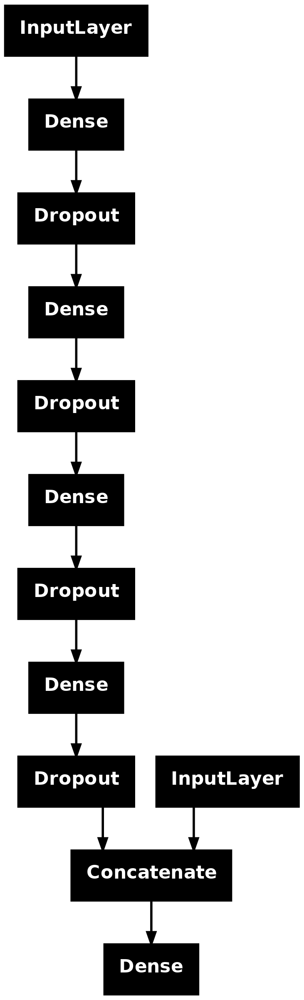

Training Progress:  54%|█████████████████████████████████▍                            | 270/500 [00:44<00:31,  7.40it/s]

Epoch 270: early stopping


Training Progress:  54%|█████████████████████████████████▍                            | 270/500 [00:44<00:37,  6.10it/s]


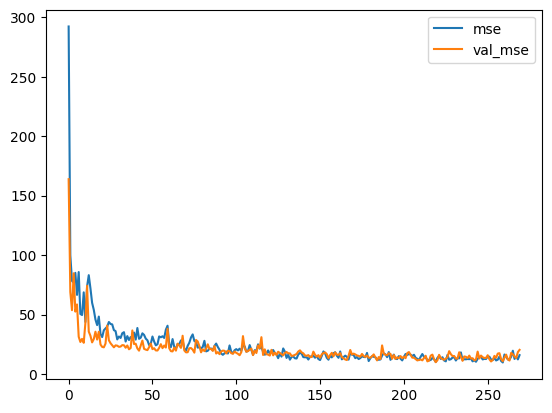

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


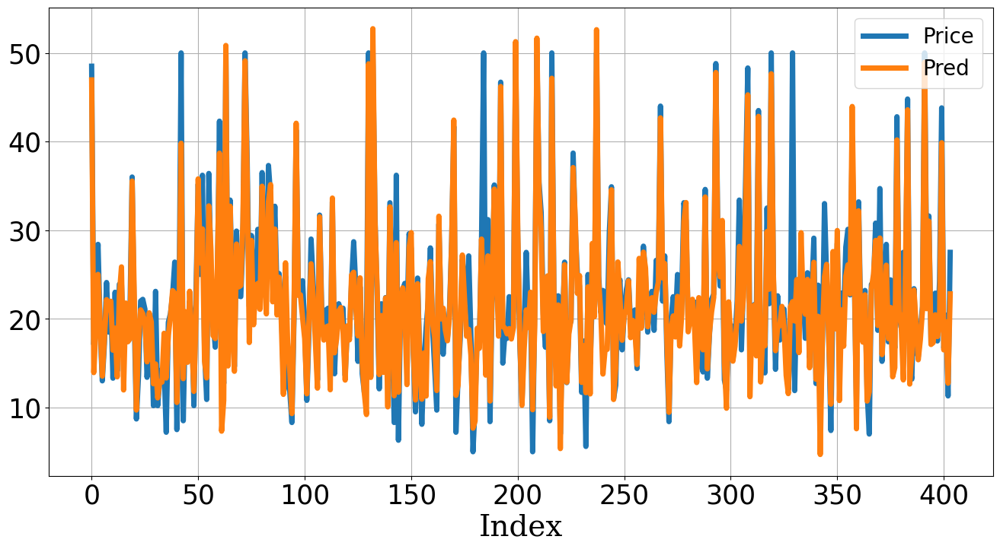

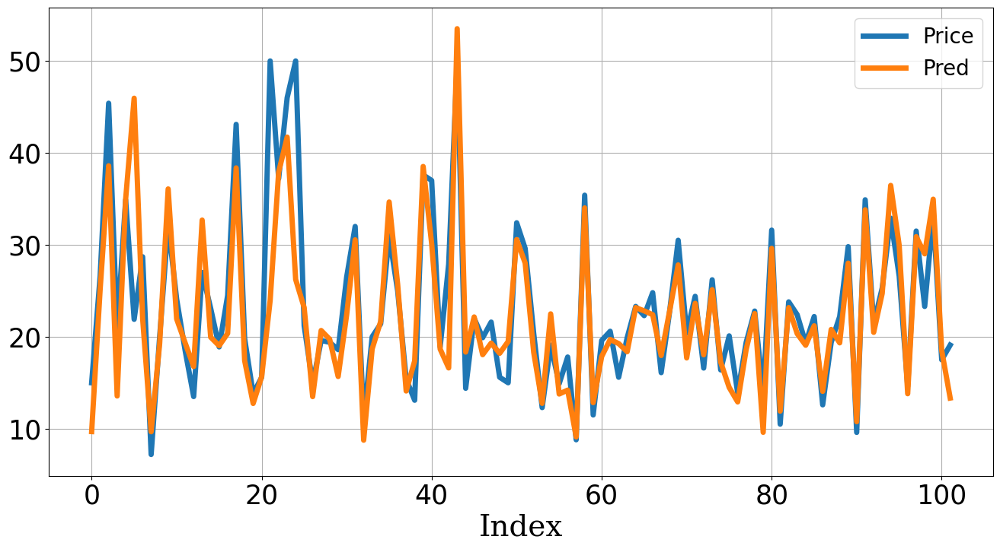

,MAE,MSE,MAPE
Train,2.15,11.58,0.11
Test,2.93,26.65,0.13


In [22]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 500
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BostonHousing_WideDeep.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_regression import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'BostonHousingPrice', 'Price_Modify_KK.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = prep(df)

Y_colname = ['Price']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

X_train_fe = feature_engineering(X_train)
X_test_fe = feature_engineering(X_test)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)   

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
###
INPUT_WIDE = X_train_fes.shape[1]    # 5
INPUT_DEEP = X_train_fes.shape[1]    # 10
X_trainW, X_trainD = X_train_fes.iloc[:,:INPUT_WIDE], X_train_fes.iloc[:,:INPUT_DEEP]
X_testW, X_testD = X_test_fes.iloc[:,:INPUT_WIDE], X_test_fes.iloc[:,:INPUT_DEEP]
X_train_fes = (X_trainW, X_trainD)
X_test_fes = (X_testW, X_testD)
###

inputW = Input(shape=(INPUT_WIDE,))
inputD = Input(shape=(INPUT_DEEP,))
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputD)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = concatenate([inputW, hiddens])
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model([inputW, inputD], output)  
model.summary() 
display(plot_model(model)) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


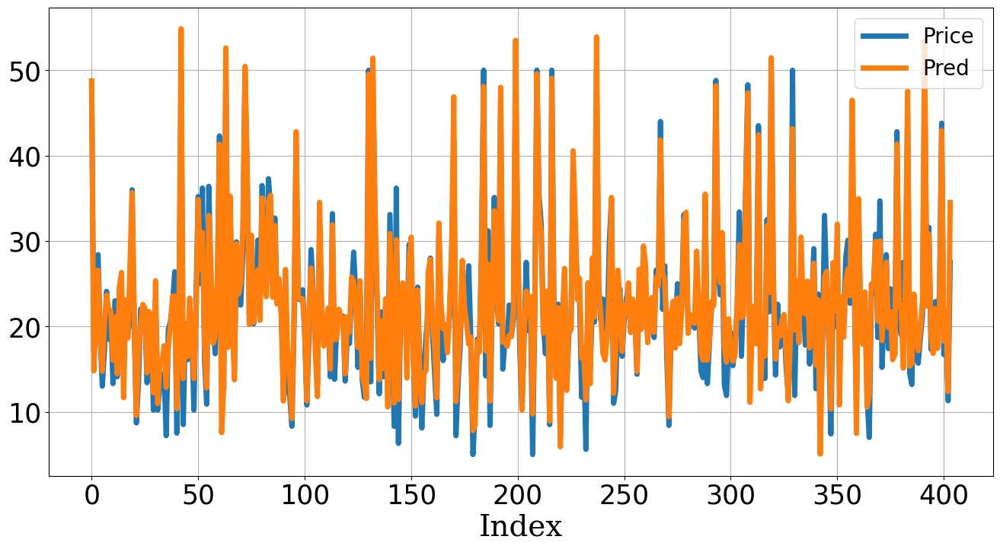

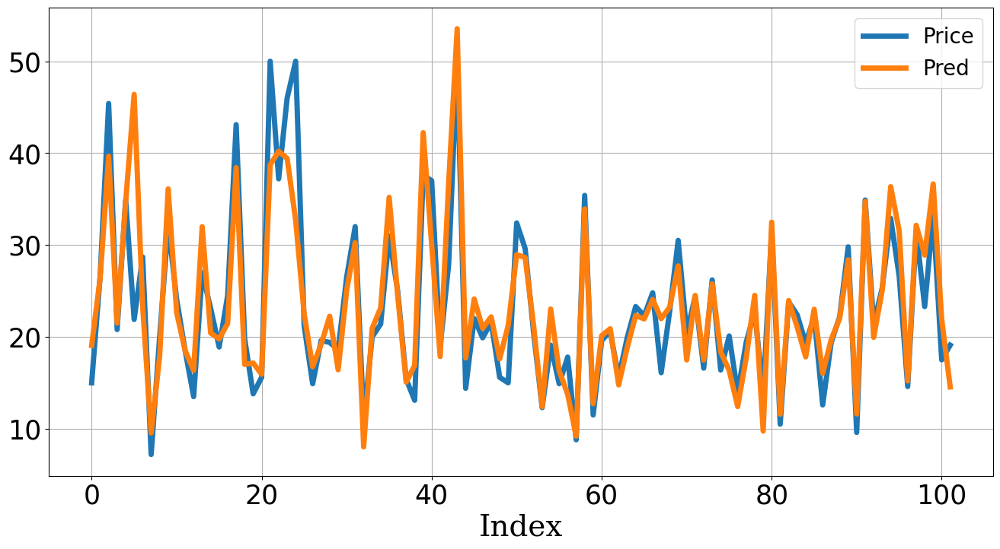

,MAE,MSE,MAPE
Train,1.88,6.43,0.11
Test,2.69,18.26,0.12


In [23]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

# **Classification Problem:** 타이타닉 생존자 예측

|     **변수**     |                           **설명**                          |
|:------------:|:-------------------------------------------------------:|
| **PassengerId**  |                        승객 번호                        |
|   **Survived**   |                 생존여부(1:생존, 0:사망)                |
|    **Pclass**    |           승선권 클래스(1:1st, 2:2nd, 3:3rd)            |
|     **Name**     |                        승객 이름                        |
|     **Sex**      |                        승객 성별                        |
|     **Age**      |                        승객 나이                        |
|    **SibSp**     |                동반한 형제자매, 배우자 수               |
|    **Patch**     |                   동반한 부모, 자식 수                  |
|    **Ticket**    |                     티켓의 고유 넘버                    |
|     **Fare**     |                       티켓의 요금                       |
|    **Cabin**     |                        객실 번호                        |
|   **Embarked**   | 승선한 항구명(C:Cherbourg, Q:Queenstown, S:Southampton) |

## Logistic Regression

**1-1) 알고리즘 함수세팅:** 분류문제를 푸는 대표적인 알고리즘 `Logistic Regression`

- `범주형 종속변수`의 적합/추정하기 위한 `변환과정` 필요
- `Logistic/Sigmoid Function`를 사용하여 `곡선(S-curve) 형태로 변환`

<center><img src='Image/Expert/Linear_Logistic.png' width='600'></center>

> **(1) 회귀분석 추정:**
>
>\begin{align*}
Y \approx \hat{Y} &= f(X_1, X_2, ..., X_k) \\
&= w_0 + w_1X_1 + w_2X_2 + \cdots + w_kX_k \\
&= XW
\end{align*}
>
> **(2) 시그모이드 변환(Logistic/Sigmoid Transformation):** `Binary Classification` 반영하는 `곡선 형태`로 변경
>
>\begin{align*}
Pr(\hat{Y}) &= \dfrac{1}{1+exp(-\hat{Y})} \\ 
&= \dfrac{1}{1+exp(-XW)} \\
&= \dfrac{exp(XW)}{1+exp(XW)}
\end{align*}
>
> **(3) 로짓 변환(Logit Transformation):** `X`의 선형관계 형태로 변환하여 `변수들`로 `Y=1`인 확률 추정
>
>\begin{align*}
Pr(\hat{Y}) \left( 1 + exp(XW) \right) &= exp(XW) \\
Pr(\hat{Y}) &= \left( 1 - Pr(\hat{Y}) \right) exp(XW) \\
\text{Odds(ratio):} \left( \dfrac{Pr(\hat{Y})}{1 - Pr(\hat{Y})} \right) &= exp(XW) \\
\text{Logit(log-odds): } log \left( \dfrac{Pr(\hat{Y})}{1 - Pr(\hat{Y})} \right) &= XW = w_0 + w_1X_1 + w_2X_2 + \cdots + w_kX_k \\
\end{align*}

---

**1-2) 추정 결과 해석:**

> **(1) 해석 방향:** $\hat{Logit}$과 $\hat{Odds}$ `변환`으로 가능
> $$
\begin{align*}
\text{Logit: } log \left( \dfrac{Pr(Y)}{1 - Pr(Y)} \right) &= X\hat{W} = \hat{w}_0 + \hat{w}_1X_1 + \hat{w}_2X_2 + \cdots + \hat{w}_kX_k \\
\text{Odds: } \left( \dfrac{Pr(Y)}{1 - Pr(Y)} \right) &= exp(X\hat{W}) = exp(\hat{w}_0 + \hat{w}_1X_1 + \hat{w}_2X_2 + \cdots + \hat{w}_kX_k) \\
\end{align*}
$$
>
> **(2) 회귀분석과 달리 `Y`의 로짓변환 값을 `X`의 선형관계로 추정하기 때문에, 해석시 `Odds`로 변환해서 해석해야 하므로 `주의`**
>
> \begin{align*}
\left( \dfrac{Pr(Y)}{1 - Pr(Y)} \right) = exp(0.01 + 0.8 X_1)
\end{align*}
>
> - **선형회귀분석:** $X_1$이 1만큼 증가하면 $Y$는 $w_1$만큼 증가
>
>> : $X_1$이 `1`만큼 증가하면 $Y$는 `0.8`만큼 증가
>
> - **로지스틱회귀분석:** $X_1$이 1만큼 증가하면 $\left( \dfrac{Pr(\hat{Y})}{1 - Pr(\hat{Y})} \right)$ 범주변화는 $exp(w_1)$만큼 증가
>
>> : $X_1$이 `1`만큼 증가하면 암에 걸리지 않을 확률보다 암에 걸릴 확률이 $exp(0.8)$ = `2.23`배 더 높음
>
> **(3) Y 확률 예측:** `추정된 계수`의 함수를 `로지스틱 변환`으로 출력
>
> \begin{align*}
Pr(\hat{Y}) &= \dfrac{1}{1+exp(-X\hat{W})} = \dfrac{exp(X\hat{W})}{1+exp(X\hat{W})}
\end{align*}
>
> **(4) 분류 의사결정:** 기본 임계값은 `0.5`로 Y 확률 예측 값이 `0.5 이상이면 1`, `0.5 미만이면 0`으로 분류
>
> \begin{align*}
\hat{Y} = \begin{cases} 1 ~~~~ \text{if } ~~~ Pr(\hat{Y}) >= 0.5 \\ 0 ~~~~ \text{if } ~~~ Pr(\hat{Y}) < 0.5 \end{cases}
\end{align*}

---

**2) 함수 추정을 위한 비용함수:** 나의 주장 기반 알고리즘의 `분류값`($Pr(\hat{Y})$)과 `실제 데이터`($Y$)의 차이를 평가하는 함수

- **이슈: `잔차`를 사용하는 Linear Regression 비용함수 적용 어려움**    

> (1) 분류문제에서는 $\hat{Y}$를 사용한 `잔차(에러)계산이 무의미`   
>
> (2) 잔차($Y - \hat{Y}$)를 `시그모이드 및 로짓 변환`을 하면 Non-convex 형태가 되서 `최소값(Global Minimum) 추정 어려움`    
>
> (3) 정확한 `수학적 방정식 기반` 계수추정 어렵기에 `확률론적 접근 필요`    
>
> <center><img src='Image/Expert/Cost_Comparison.png' width='600'></center>

- **방향:** 회귀문제와 달리 `새로운 비용함수`가 필요

> - Y를 `잘` 분류하면 `cost=0`으로 그렇지 않으면 cost=$\infty$가 되는 방향
>> - (빨간선) 실제값이 `1`일때 예측값이 `1`이면 Cost는 `0`
>> - (빨간선) 실제값이 `1`일때 예측값이 `0`이면 Cost는 `무한대`
>
> \begin{align*}
\text{Cost} = \begin{cases} -log(Pr(\hat{Y})) ~~~~ & \text{in the case of } ~~~ Y = 1 \\ -log(1-Pr(\hat{Y})) ~~~~ & \text{in the case of } ~~~ Y = 0 \end{cases}
\end{align*}
> <center><img src='Image/Expert/Cost_Logistic.png' width='600'></center>

- **Cross Entropy 등장:** Y가 0과 1인 경우의 `Cost를 결합`하여 하나의 식으로 표현

> - 로지스틱 알고리즘은 `비용함수`로 `Cross Entropy`를 사용하고 `최소로 하는 계수/가중치 추정`
> - `Y=0`인 경우 `파란부분`만 남고 `Y=1`인 경우 `빨간부분`만 남아 `Class별`로 독립적으로 작동
> - 분류문제의 `Cost 함수는 다양`하고 많지만 통계학적으로 `Cross Entropy`는 계수 추정에 `효율적`인 편
> - `Convex 형태`이기 때문에 `Global Minimum`을 찾기가 용이함
> - 추정된 계수/가중치($\hat{w}$)로 방정식을 만들어 Y=1인 `분류확률` 계산 가능
>
>\begin{align*}
\text{Cost} &= \sum_{i=1}^{m} \left[ - \color{red}{\hat{Y}_{i} log (Pr(\hat{Y}_{i}))} - \color{blue}{(1-\hat{Y}_{i}) log (1-Pr(\hat{Y}_{i}))} \right] \\
\hat{W} &= \underset{W}{\arg\min} \sum_{i=1}^{m} \left[\text{Cost} \right] \\
\end{align*}


(712, 11) (712, 1)
(179, 11) (179, 1)
Effect of X..


,features,coef,odds
0,const,2.62,13.76
1,PassengerId,0.17,1.18
2,Pclass,-1.61,0.20
3,Sex,-1.39,0.25
4,Age,-1.26,0.28
5,SibSp,-1.87,0.15
6,Parch,-0.87,0.42
7,Ticket,0.47,1.59
8,Fare,0.72,2.06
9,Cabin,-0.35,0.70


Confusion Matrix: Test


,Pred 0,Pred 1
True 0,99,15
True 1,14,51


Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.88      0.87      0.87       114
     class 1       0.77      0.78      0.78        65

    accuracy                           0.84       179
   macro avg       0.82      0.83      0.83       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


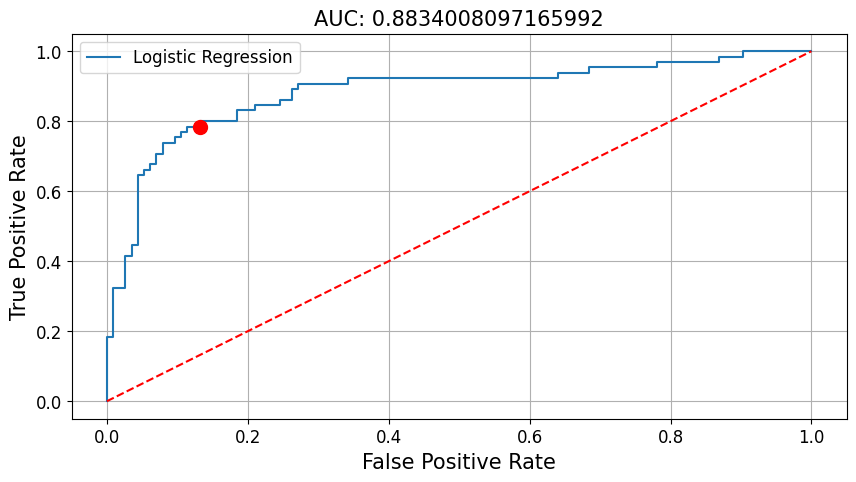

,Accuracy,AUC
Train,0.83,0.81
Test,0.84,0.83


In [24]:
# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Logistic Regression
X_train_fes = sm.add_constant(X_train_fes)
X_test_fes = sm.add_constant(X_test_fes)

model_logitreg = LogisticRegression(fit_intercept=False)
model_logitreg.fit(X_train_fes, Y_train)

## 계수 해석
print("Effect of X..")
display(pd.DataFrame({'features': X_train_fes.columns,
                      'coef': model_logitreg.coef_[0],
                      'odds': np.exp(model_logitreg.coef_[0])}))

# 예측
Y_trpred = model_logitreg.predict(X_train_fes)
Y_tepred = model_logitreg.predict(X_test_fes)
P_trpred = model_logitreg.predict_proba(X_train_fes)
P_tepred = model_logitreg.predict_proba(X_test_fes)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
display(evaluation_class_ConfusionMatrix(Y_test, Y_tepred))

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred[:,1])

## 성능검증
Score_logitreg = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_logitreg

## Random Forest (Bagging)

**"데이터를 `복원샘플링`하여 나눈 샘플들로 `같은 알고리즘`으로 학습 후 `보팅` 방식으로 최종 예측"**

<center><img src='Image/Expert/Ensemble_Bagging.jpg' width='400'></center> 

(712, 11) (712, 1)
(179, 11) (179, 1)
변수 중요도: 


,Importance
PassengerId,0.18
Pclass,0.06
Sex,0.11
Age,0.08
SibSp,0.05
Parch,0.03
Ticket,0.05
Fare,0.16
Cabin,0.06
Name_Mr,0.15


Confusion Matrix: Test


,Pred 0,Pred 1
True 0,98,16
True 1,15,50


Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.87      0.86      0.86       114
     class 1       0.76      0.77      0.76        65

    accuracy                           0.83       179
   macro avg       0.81      0.81      0.81       179
weighted avg       0.83      0.83      0.83       179

ROC Curve: Test


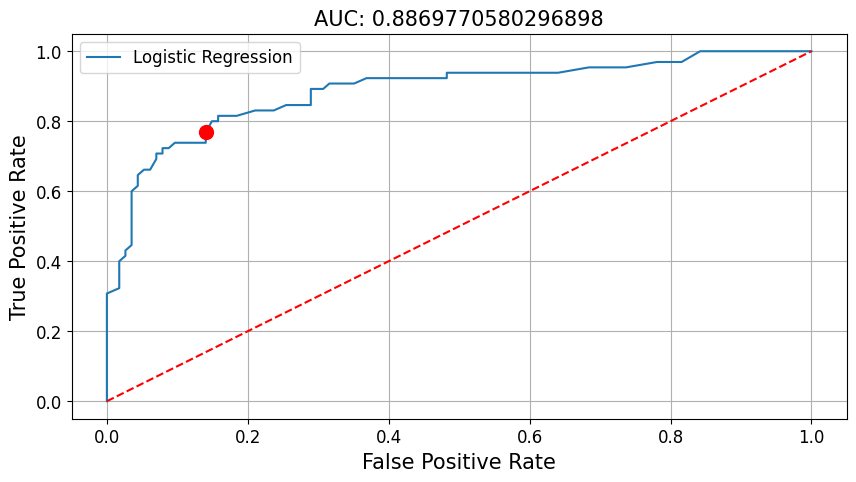

,Accuracy,AUC
Train,1.00,1.00
Test,0.83,0.81


In [25]:
# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Random Forest
model_rf = RandomForestClassifier(n_estimators=100, random_state=123)
model_rf.fit(X_train_fes, Y_train)
print("변수 중요도: ")
display(pd.DataFrame(model_rf.feature_importances_, 
                     index=model_rf.feature_names_in_, columns=['Importance']))

# 예측
Y_trpred = model_rf.predict(X_train_fes)
Y_tepred = model_rf.predict(X_test_fes)
P_trpred = model_rf.predict_proba(X_train_fes)
P_tepred = model_rf.predict_proba(X_test_fes)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
display(evaluation_class_ConfusionMatrix(Y_test, Y_tepred))

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred[:,1])

## 성능검증
Score_rf = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_rf

## Stacking

> **"`개별 알고리즘`을 서로 `결합하여 예측`"**

---

- 배깅 또는 부스팅과 유사하지만, 가장 큰 차이는 `개별 알고리즘`으로 `예측한 데이터`를 학습하여 `다시 예측`
- 개별 알고리즘의 예측 데이터를 `메타 데이터`라고 지칭하는 편
- 메타 데이터를 `별도의 알고리즘`으로 `최종 학습` 후 `최종 예측`하며 이때의 알고리즘을 `메타 알고리즘`라고 지칭하는 편
- 스태킹 모델링 시, `2종류 알고리즘` 필요

> (1) 개별적인 모델링에 사용할 `개별 알고리즘`
>
> (2) 개별 기반 예측 데이터를 학습하고 예측하는데 필요한 `메타 알고리즘`

<center><img src='Image/Expert/Stacking_Structure.png' width='500'>(http://rasbt.github.io/mlxtend/user_guide/classifier/StackingClassifier/)</center> 

- `캐글과 같은 대회`에서 높은 순위를 차지하기 위해 성능 수치를 높여야 할 경우 자주 사용됨
- 일반적으로 `성능이 비슷한 모델을 결합`해서 좀더 나은 `성능 향상`을 도출
- 2~3개의 개별 모델만을 결합해서 쉽게 예측 성능을 향상시킬 수 없음
- 스태킹을 적용한다고 해서 반드시 성능 향상 된다는 보장 없음
- `과적합` 단점을 개선하기 위해 다양한 `CV(Cross Validation)` 방식을 사용한, 다양한 `CV기반 Stacking` 알고리즘 존재


(712, 11) (712, 1)
(179, 11) (179, 1)
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.86      0.83      0.85       114
     class 1       0.72      0.77      0.75        65

    accuracy                           0.81       179
   macro avg       0.79      0.80      0.80       179
weighted avg       0.81      0.81      0.81       179

ROC Curve: Test


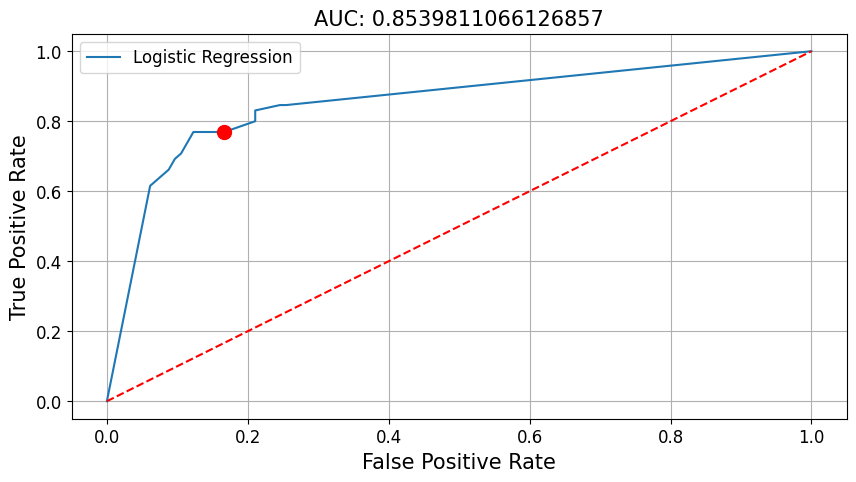

,Accuracy,AUC
Train,1.00,1.00
Test,0.81,0.80


In [26]:
# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Stacking
## Weak Learners
model_knn = KNeighborsClassifier()
model_svm = SVC()
model_rf = RandomForestClassifier()
model_xgb = XGBClassifier(eval_metric='mlogloss')

model_logitreg = LogisticRegression()
clf = [model_knn, model_svm, model_rf, model_xgb]
model_stack = StackingClassifier(classifiers=clf, 
                                 meta_classifier=model_logitreg)
model_stack.fit(X_train_fes, Y_train.values)

# 예측
Y_trpred = model_stack.predict(X_train_fes)
Y_tepred = model_stack.predict(X_test_fes)
P_trpred = model_stack.predict_proba(X_train_fes)
P_tepred = model_stack.predict_proba(X_test_fes)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred[:,1])

## 성능검증
Score_stack = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_stack

## Multi-Layered Perceptron

**1) 방향:** 인공신경망의 `비선형성 접근 필요성`으로  `은닉층`을 반영항 `다층/심층신경망으로 딥러닝을 출발시킴`

- `2개의 직선` 또는 `여러개의 직선이 결합된 1개의 곡선`을 이용하여 제대로 분류가 가능할 것이라 가정
- `다층(여러개의 직선)신경망`으로 비선형 문제를 해결 (Hinton, 1986)  

<center><img src='Image/Expert/DL_Compare_MLP.jpg' width='500'></center>

- 여러문제가 해결되면서 `은닉층을 늘려 학습 결과를 향상`시키는 방법이 등장하며 `DNN(Deep Neural Network)`라고 함

<center><img src='Image/Expert/DL_ANN_MLP.bmp' width='600'>(https://4ir.kisti.re.kr/)</center>

- 은닉층의 수가 증가하면 더욱 어려운 문제를 풀수 있는데, 통상 `은닉층을 최소 2개이상 가진 알고리즘`을 `딥러닝(Deep Learning)` 알고리즘 이라고 함

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

**2) 한계:** 층(Layer)의 수가 많아지면서 `늘어나는 Weights를 수동으로 학습하기에 한계`가 있기에 여전히 데이터 학습 불가

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 128)            │         2,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,497 (41.00 KB)

 Trainable params: 10,497 (41.00 KB)

 Non-trainable params: 0 (0.00 B)

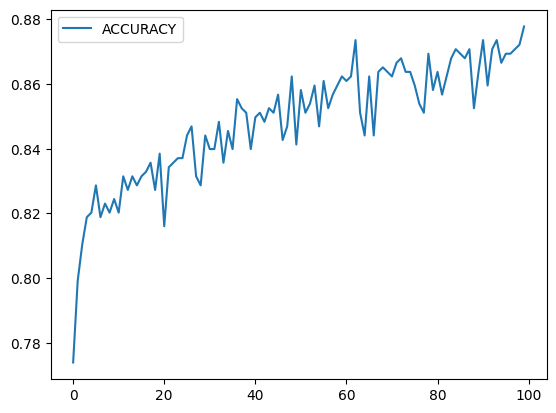

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.88      0.81      0.84       114
     class 1       0.70      0.80      0.75        65

    accuracy                           0.80       179
   macro avg       0.79      0.80      0.79       179
weighted avg       0.81      0.80      0.81       179

ROC Curve: Test


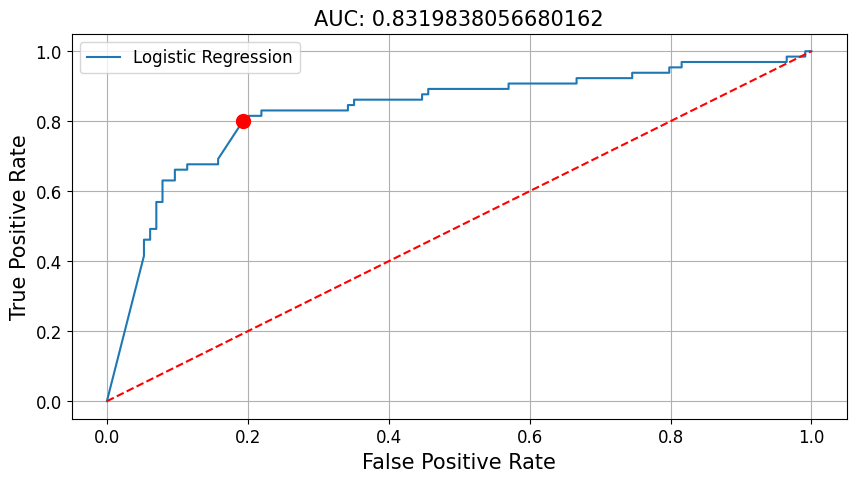

,Accuracy,AUC
Train,0.87,0.87
Test,0.80,0.80


In [27]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

## Comparison of Modeling Codes

```python
# Logistic Regression
model_logitreg = LogisticRegression(fit_intercept=False)
model_logitreg.fit(X_train_fes, Y_train)

# Random Forest
model_rf = RandomForestClassifier(n_estimators=100, random_state=123)
model_rf.fit(X_train_fes, Y_train)

# Stacking
model_knn = KNeighborsClassifier()
model_svm = SVC()
model_rf = RandomForestClassifier()
model_xgb = XGBClassifier(eval_metric='mlogloss')

model_logitreg = LogisticRegression()
clf = [model_knn, model_svm, model_rf, model_xgb]
model_stack = StackingClassifier(classifiers=clf, 
                                 meta_classifier=model_logitreg)
model_stack.fit(X_train_fes, Y_train)

# MLP
## same as regression problem!
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  

model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
```


# **Performance Update**

> **"(1) `실제 데이터`에 머신러닝과 딥러닝 알고리즘으로 데이터분석 프로세스를 완성하고,"**
>
> **"(2) `딥러닝 알고리즘의 한계점을 보완`하기 위해 `Vanishing Gradient 이슈, 과적합 이슈, 하이퍼파라미터 최적화 등`으로 개선"**
>
> - **하이퍼파라미터 튜닝:** 실행마다 결과는 달라질 수 있고 `비용함수를 수동으로 최소로 만드는 것`
> - **인공지능 개발:** 하이퍼파라미터 튜닝으로 `낮은 비용함수와 높은 예측성능`을 획득 하는 것


## Increasing Hidden Layers

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

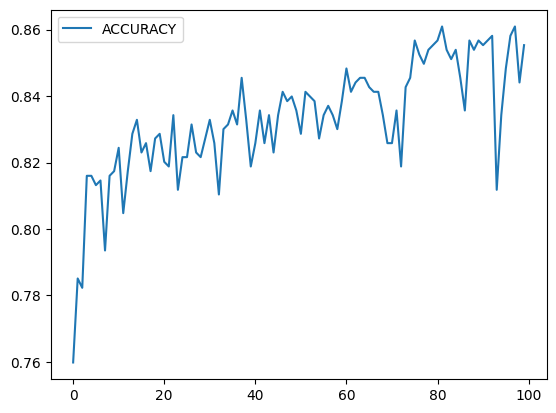

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.84      0.85      0.84       114
     class 1       0.73      0.71      0.72        65

    accuracy                           0.80       179
   macro avg       0.78      0.78      0.78       179
weighted avg       0.80      0.80      0.80       179

ROC Curve: Test


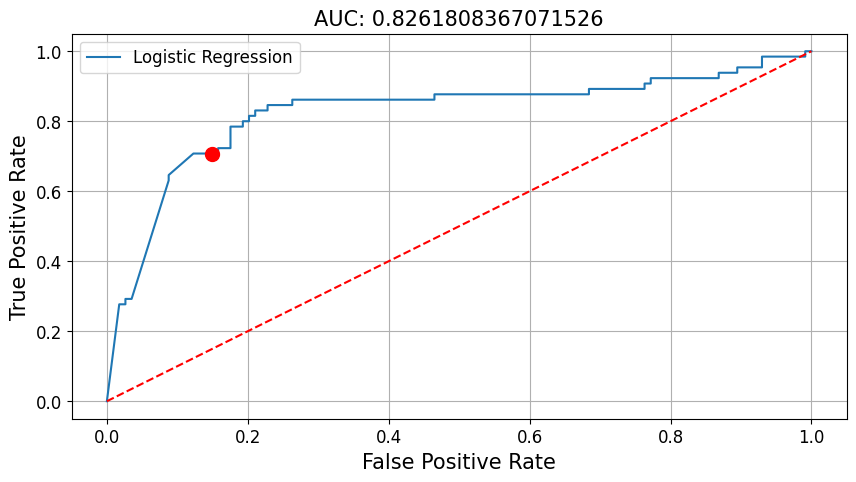

,Accuracy,AUC
Train,0.86,0.85
Test,0.80,0.78


In [28]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

## Regularization

**1) Regularization:** `비용함수를 개선`하여 과적합 낮춤

> **"`추정 가중치가 커지면` 활성함수를 통해 `기울기가 급변`하게되어 비용함수 최소화가 어렵고 `과적합 높아짐`"**   
>
> **(0) Linear Regression:** `MSE`를 비용함수로 사용
>
> <center> $\hat{w} = \underset{w}{\arg\min} \Biggl[\displaystyle \sum_{j=1}^t \Bigl(y_j - \displaystyle \sum_{i=0}^k w_i x_{ij}\Bigr)^2\Biggr]$ </center>
>
> **(1) L1 Panelty:** `LASSO Regression`에 사용한 비용함수 반영    
>
> \begin{align*}
\hat{w} = \underset{w}{\arg\min} \Biggl[\displaystyle \sum_{j=1}^t \Bigl(y_j - \displaystyle \sum_{i=0}^k w_i x_{ij}\Bigr)^2 + \lambda \displaystyle \sum_{i=0}^k \left|w_i \right|\Biggr] \\ where~\lambda~is~hyper~parameter(given~by~human)
\end{align*}
>
> - `중요도가 낮은 변수`의 가중치는 0으로 출력하여 과적합 방지
> - `변수선택 효과`가 있어 모델 복잡도를 효과적으로 제약
> - 샘플 수보다 변수가 많더라도 변수선택 효과 때문에 `고차원의 데이터도 적용가능`
> - `패널티의 정도`는 Hyperparameter로 사전 결정되며 교차검증이나 유사 방법으로 결정
> - `모델에 제약`을 주며 정확도를 상승시킴   
>
> **(2) L2 Panelty:** `Ridge Regression`에 사용한 비용함수 반영   
>
> \begin{align*}
\hat{w} = \underset{w}{\arg\min} \Biggl[\displaystyle \sum_{j=1}^t \Bigl(y_j - \displaystyle \sum_{i=0}^k w_i x_{ij}\Bigr)^2 + \lambda \displaystyle \sum_{i=0}^k w_i^2\Biggr] \\ where~\lambda~is~hyper~parameter(given~by~human)
\end{align*}
>
> - `모든 가중치`를 일률적으로 `작게 만드는 경향`
> - `중요도 낮은 변수`라도 0이 아닌 가중치를 출력하므로 `일반화 및 변수비교 효과`
> - 일반화 및 패널티 효과를 높이기 위해 `L1 보다 L2를 많이 사용하는 경향`

<center><img src='Image/Expert/DL_CF_L1L2.png' width='600'></center>

<center><img src='Image/Expert/DL_CF_L1L2_Compare.png' width='600'></center>
<!-- (https://kevinthegrey.tistory.com/110) -->

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

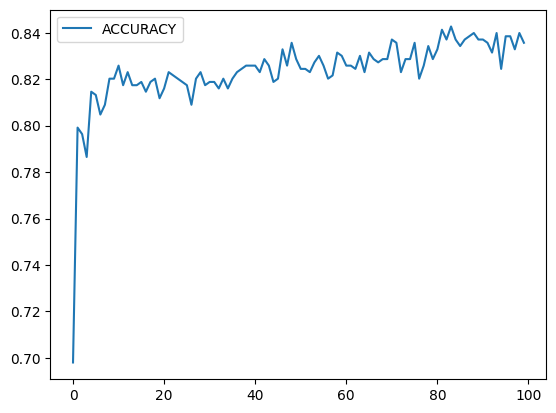

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.86      0.90      0.88       114
     class 1       0.81      0.74      0.77        65

    accuracy                           0.84       179
   macro avg       0.84      0.82      0.83       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


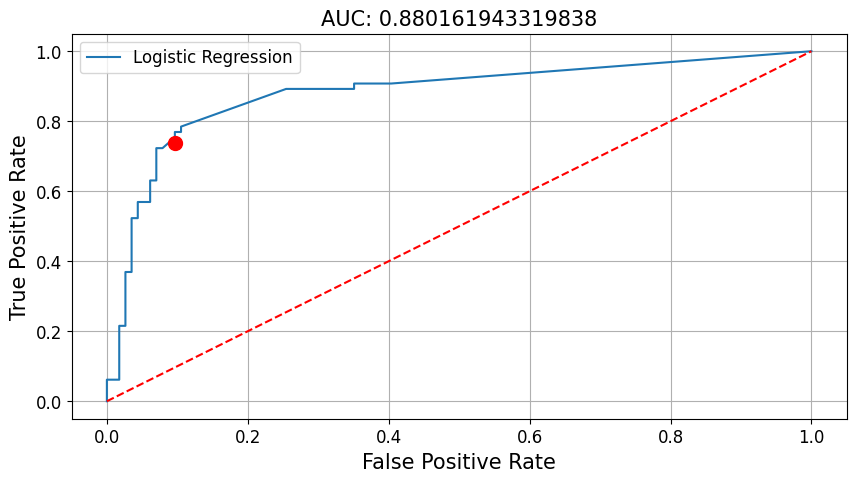

,Accuracy,AUC
Train,0.85,0.83
Test,0.84,0.82


In [29]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

## Drop Out

**2) Drop Out:** 각 `batch마다` 은닉층의 `일부 뉴런을 무작위 확률로 제외(출력을 0으로 변환)`하면서 학습 

> **"`모든 직원`이 함께 일하는 것 < `소그룹`의 결과를 통합하는 것 $\rightarrow$ 더욱 효율적일수도"**    
>
> **"각 단계의 줄어든 뉴런은 약한 학습이지만 `약한 모델들이 합쳐져 강력한 예측력`"**   
>
> - `Labeled 데이터의 부족`과 `Overfitting 문제 해결`을 위해 Drop Out 제안 (Hinton et al. 2012)
> - 학습할 때마다 `일부 유닛만을 사용하고 이를 반복해서 합치는 방식`으로 `Ensemble과 유사`
> - 빠진 뉴런들로 예측 하기에 `여러개의 국소적 독립적 내부패턴 학습가능`
> - 네트워크가 `뉴런의 특정 가중치에 덜 민감해짐`
> - `더욱 일반화에 기여가 가능`하고 훈련 데이터에만 과적합 가능성 적어짐
> - 너무 낮은 비율은 효과가 적고 너무 높은 비율은 과소적합 하기에 `20~50% 권장`
> - 일반적으로 `Learning Rate(LR, 10->100)과 Momentum(0.9 or 0.99)을 높여 사용`
> - LR을 높여 가중치의 크기를 줄이면 Ridge와 유사하게 `과적합이 줄어 높은 성능`

<center><img src='Image/Expert/DL_DropOut.png' width='500'></center>
<!-- (https://t1.daumcdn.net/cfile/tistory/99324B335D383CBD1B) -->

> - 랜덤한 뉴런을 제거하는 것 대신, `연결선을 랜덤하게 제거하는 DropConnect 방법(별도 외장함수)`도 존재 (Wan et al. 2013)
> - Dropout을 Dropconnect로 표현할 수 있지만, `Dropconnect를 Dropout으로 표현하기 어려움`
> - `특정 노드를 비활성화` = `특정 노드에 연결된 모든 가중치를 비활성화`

<center><img src='Image/Expert/Dropout_Dropconnect.png' width='500'>(https://stats.stackexchange.com/questions/201569/what-is-the-difference-between-dropout-and-drop-connect)</center>

---

> - 성능변화 예시:

<center><img src='Image/Expert/DL_Dropout_Dropconnect.png' width='700'></center>

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

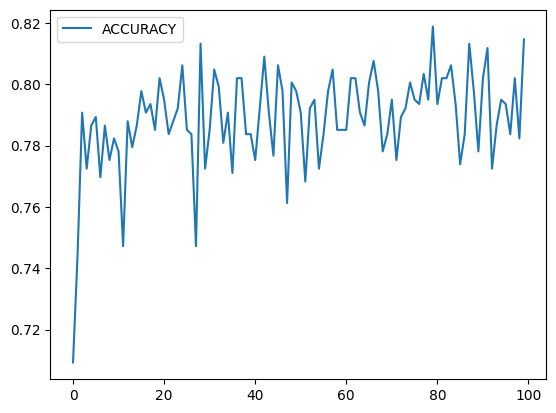

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.84      0.93      0.88       114
     class 1       0.85      0.69      0.76        65

    accuracy                           0.84       179
   macro avg       0.85      0.81      0.82       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


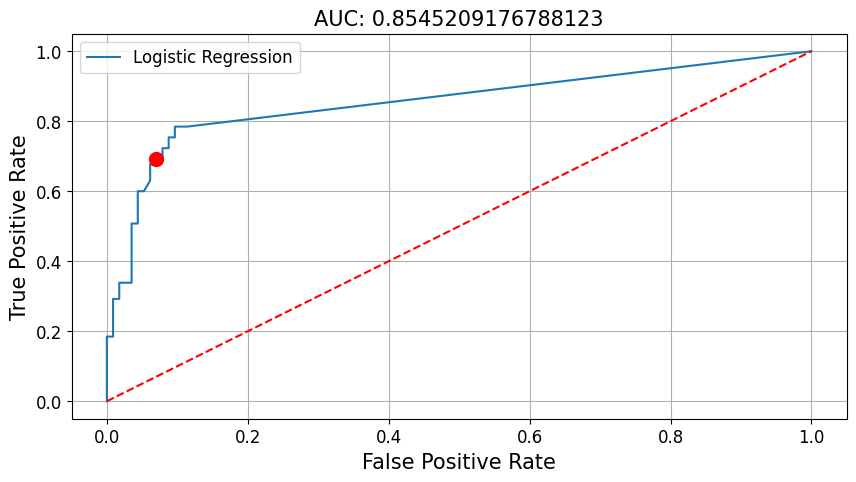

,Accuracy,AUC
Train,0.82,0.78
Test,0.84,0.81


In [30]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

## Early Stopping

**3) Early Stopping:** Test 에러가 빠르게 증가하는 경우 `계속 학습하지 않고 일찍 종료`하는 방법   

> **"데이터가 Train/Validation/Test로 구분되어 있을때, `Validation/Test의 비용함수가 낮으면 멈추므로 Train을 계속 학습하는 과적합 가능성 낮춤`"**   

<center><img src='Image/Expert/DL_Overfitting_Epoch.png' width='600'></center>

<center><img src='Image/Expert/DL_Overfitting_EarlyStopping.png' width='600'></center>
<!-- (https://kevinthegrey.tistory.com/110) -->

### Basic

- **콜백(Callbacks):** 학습 과정의 `특정 단계에서 적용할 함수의 세트`로 모델의 `학습 상태와 통계자료 확인 가능`

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_36 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_37 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_38 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

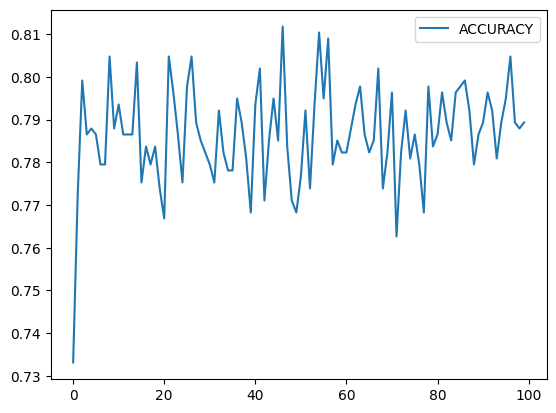

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.82      0.96      0.88       114
     class 1       0.89      0.63      0.74        65

    accuracy                           0.84       179
   macro avg       0.86      0.79      0.81       179
weighted avg       0.85      0.84      0.83       179

ROC Curve: Test


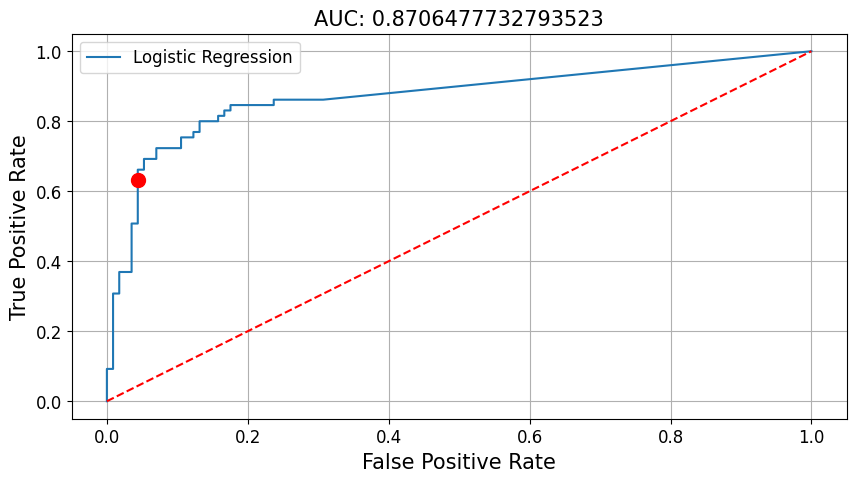

,Accuracy,AUC
Train,0.80,0.75
Test,0.84,0.79


In [31]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
CALLBACK = [callbacks.EarlyStopping(monitor='loss', mode='min', 
                                    patience=EARLYSTOP_PATIENT, verbose=1)]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

### Progress Bar

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_40 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_41 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  99%|██████████████████████████████████████████████████████████████▎| 99/100 [01:17<00:00,  1.44it/s]

Epoch 99: early stopping


Training Progress:  99%|██████████████████████████████████████████████████████████████▎| 99/100 [01:17<00:00,  1.27it/s]


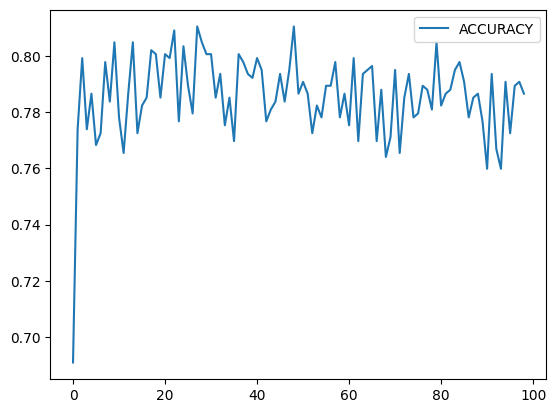

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.87      0.92      0.89       114
     class 1       0.84      0.75      0.80        65

    accuracy                           0.86       179
   macro avg       0.86      0.84      0.85       179
weighted avg       0.86      0.86      0.86       179

ROC Curve: Test


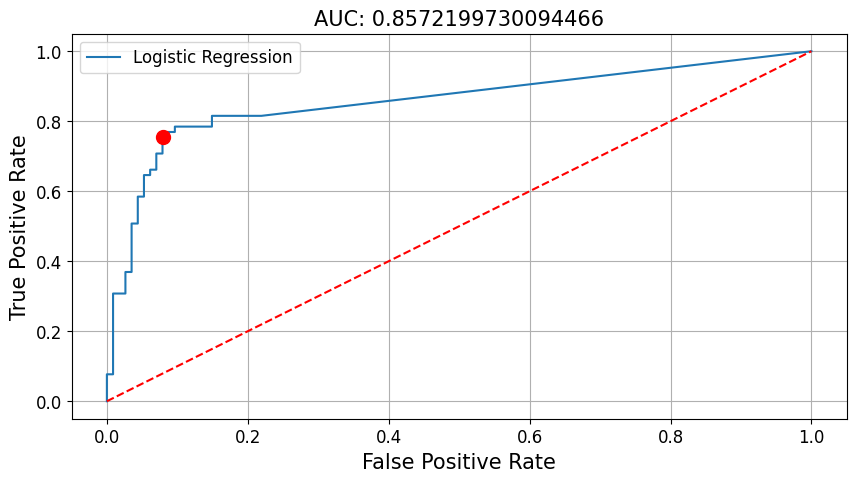

,Accuracy,AUC
Train,0.83,0.80
Test,0.86,0.84


In [32]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        """훈련 시작 시 tqdm을 초기화하여 프로그래스 바를 한 줄로 설정"""
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        """매 epoch 종료 후 프로그래스 바를 한 단계씩 업데이트"""
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        """훈련 종료 시 프로그래스 바를 닫습니다."""
        self.epochs_pbar.close()
CALLBACK = [callbacks.EarlyStopping(monitor='loss', mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar()]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

### Best Model Saving

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_84 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_44 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_45 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_46 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_47 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  99%|██████████████████████████████████████████████████████████████▎| 99/100 [01:18<00:00,  1.31it/s]

Epoch 99: early stopping


Training Progress:  99%|██████████████████████████████████████████████████████████████▎| 99/100 [01:18<00:00,  1.26it/s]


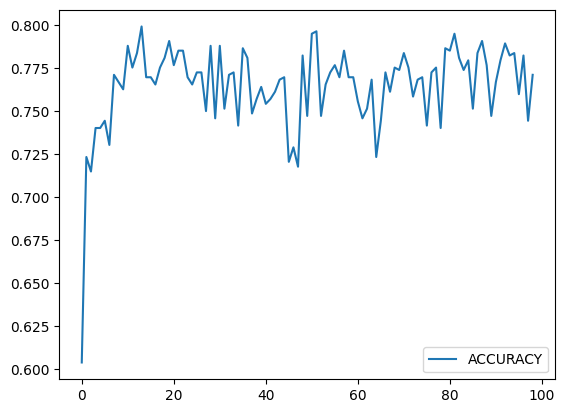

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.89      0.89      0.89       114
     class 1       0.81      0.80      0.81        65

    accuracy                           0.86       179
   macro avg       0.85      0.85      0.85       179
weighted avg       0.86      0.86      0.86       179

ROC Curve: Test


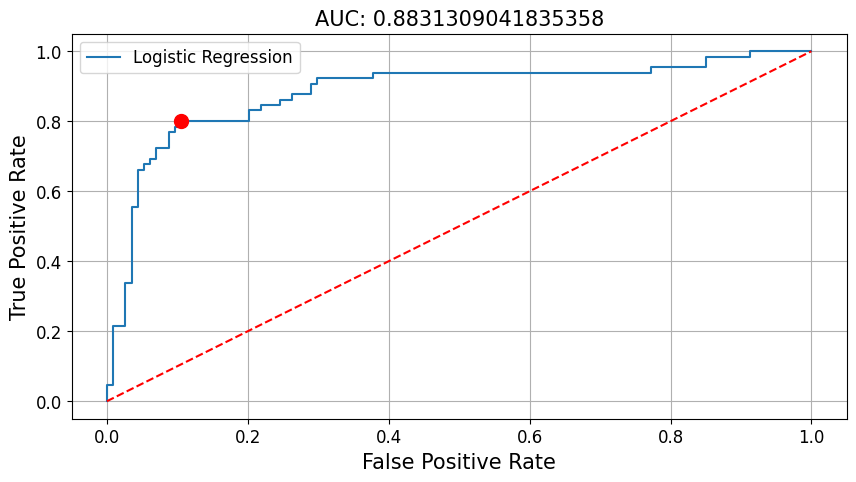

,Accuracy,AUC
Train,0.83,0.81
Test,0.86,0.85


In [33]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'loss'
FILENAME = os.path.join(os.getcwd(),'Model','Titanic_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
pd.DataFrame(model_fit.history[METRICS[0]], columns=[METRICS[0].upper()]).plot()
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

### Best Model Loading and Prediction

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.89      0.82      0.85       114
     class 1       0.73      0.82      0.77        65

    accuracy                           0.82       179
   macro avg       0.81      0.82      0.81       179
weighted avg       0.83      0.82      0.82       179

ROC Curve: Test


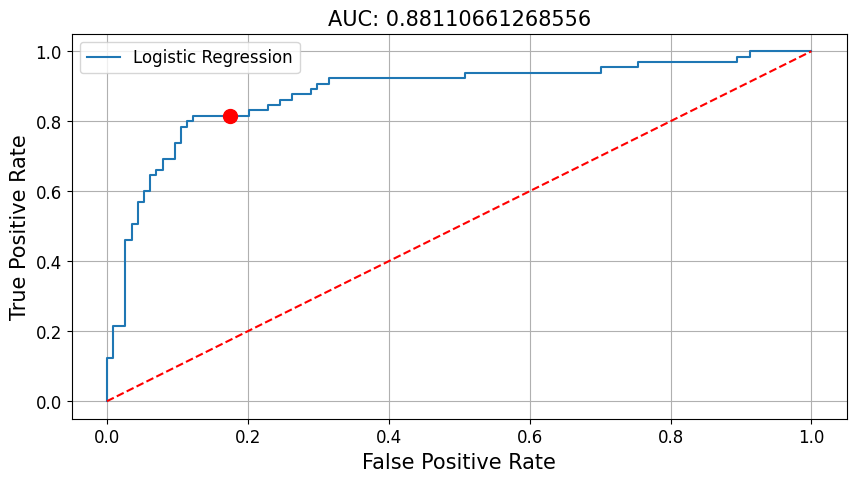

,Accuracy,AUC
Train,0.81,0.80
Test,0.82,0.82


In [34]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

### Test Validation

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_50 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_51 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress: 100%|██████████████████████████████████████████████████████████████| 100/100 [01:42<00:00,  1.03s/it]


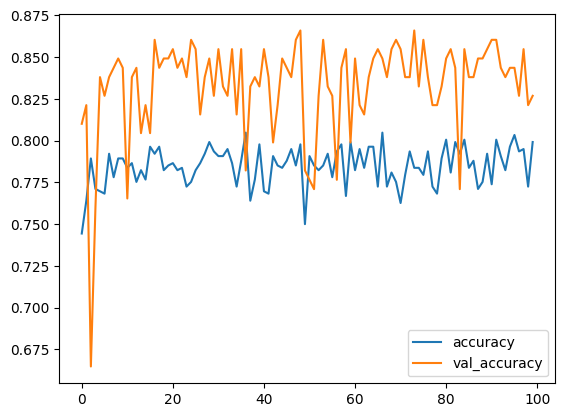

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.81      0.96      0.88       114
     class 1       0.89      0.60      0.72        65

    accuracy                           0.83       179
   macro avg       0.85      0.78      0.80       179
weighted avg       0.84      0.83      0.82       179

ROC Curve: Test


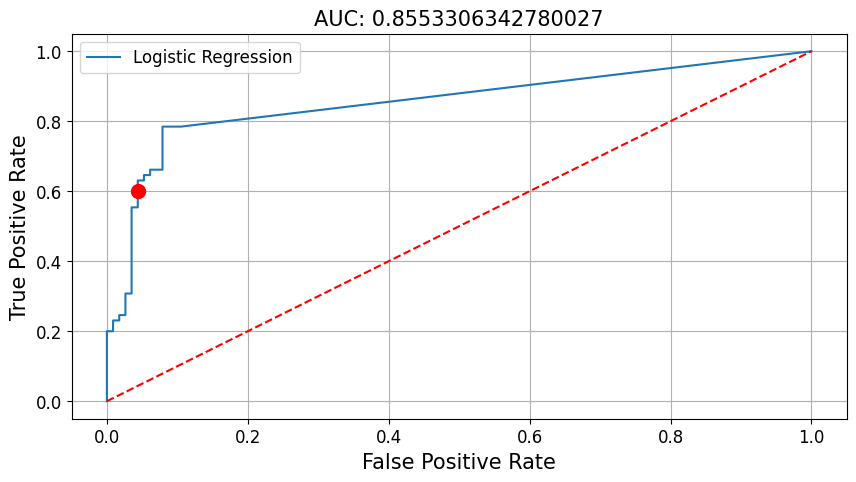

,Accuracy,AUC
Train,0.81,0.75
Test,0.83,0.78


In [35]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','Titanic_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_data=(X_test_fes, Y_test),
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

- `Test 데이터`를 기준으로 성능을 평가하여 Early Stopping 하는 것은 `미래 데이터를 이용`하는 느낌?
- Train 데이터에서 별도 `Validation 데이터를 분리하여 평가에 반영`하는 것이 올바른 방향

<center><img src='Image/Expert/DataSplit_Simple.png' width='500'></center>

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 256)            │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_52 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_53 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_54 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_55 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,617 (186.00 KB)

 Trainable params: 47,617 (186.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress: 100%|██████████████████████████████████████████████████████████████| 100/100 [01:25<00:00,  1.17it/s]


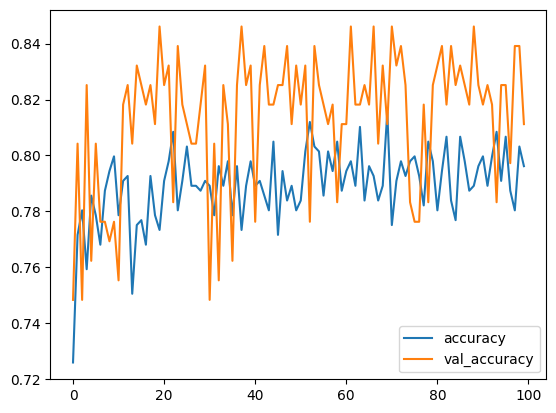

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.84      0.93      0.88       114
     class 1       0.85      0.69      0.76        65

    accuracy                           0.84       179
   macro avg       0.85      0.81      0.82       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


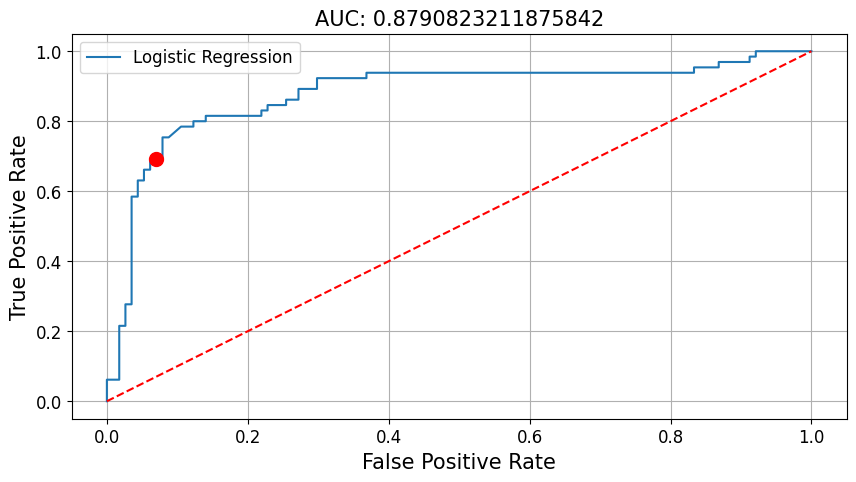

,Accuracy,AUC
Train,0.83,0.79
Test,0.84,0.81


In [36]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','Titanic_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_split=0.2,
#                       validation_data=(X_test_fes, Y_test),
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.88      0.89      0.88       114
     class 1       0.80      0.78      0.79        65

    accuracy                           0.85       179
   macro avg       0.84      0.84      0.84       179
weighted avg       0.85      0.85      0.85       179

ROC Curve: Test


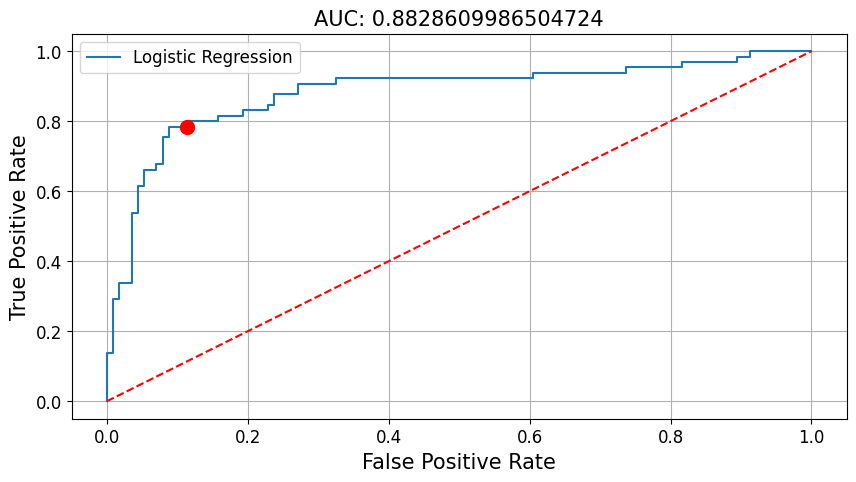

,Accuracy,AUC
Train,0.83,0.81
Test,0.85,0.84


In [37]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

## Wide and Deep Architecture

<center><img src='Image/Expert/Recommendation_AlgorithmHistory.png' width='800'></center>

> - [K. Kim et al.: DUSIN Modeling for CTR Prediction of Online Advertising (2021)](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=9316682)

---

> **"Wide & deep은 `2016년 구글`이 발표한 논문으로, `Memorization과 Generalization을 동시에` 수행할 수 있는 `추천시스템 모델`이며 `구글 플레이스토어`의 추천시스템에 활용되어 매우 효율적이며 효과적인 성능"**

<center><img src='Image/Expert/WideDeep.png' width='1000'>(Chen et al., 2016 Wide & deep learning for recommender systems. CoRR, abs/1606.07792, 2016.)</center>

### Simple Version

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22      │ (None, 16)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_99 (Dense)    │ (None, 256)       │      4,352 │ input_layer_22[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_56          │ (None, 256)       │          0 │ dense_99[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_100 (Dense)   │ (None, 128)       │     32,896 │ dropout_56[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_57          │ (None, 128)       │          0 │ dense_100[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_101 (Dense)   │ (None, 64)        │      8,256 │ dropout_57[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_58          │ (None, 64)        │          0 │ dense_101[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_102 (Dense)   │ (None, 32)        │      2,080 │ dropout_58[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_59          │ (None, 32)        │          0 │ dense_102[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 48)        │          0 │ input_layer_22[0… │
│ (Concatenate)       │                   │            │ dropout_59[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_103 (Dense)   │ (None, 1)         │         49 │ concatenate_2[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 47,633 (186.07 KB)

 Trainable params: 47,633 (186.07 KB)

 Non-trainable params: 0 (0.00 B)

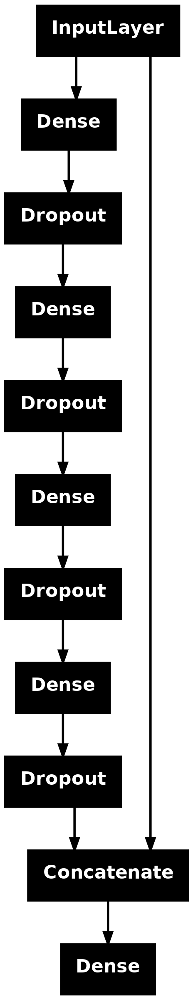

Training Progress: 100%|██████████████████████████████████████████████████████████████| 100/100 [01:30<00:00,  1.11it/s]


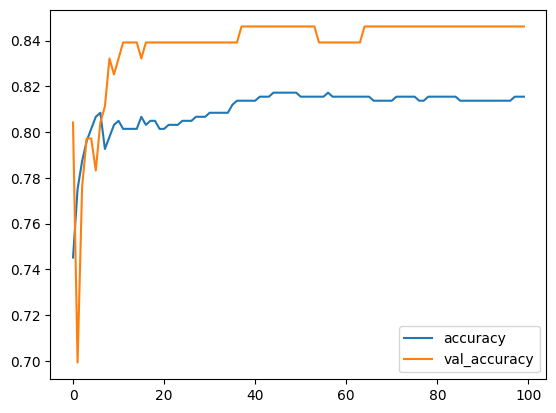

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.86      0.89      0.87       114
     class 1       0.79      0.75      0.77        65

    accuracy                           0.84       179
   macro avg       0.83      0.82      0.82       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


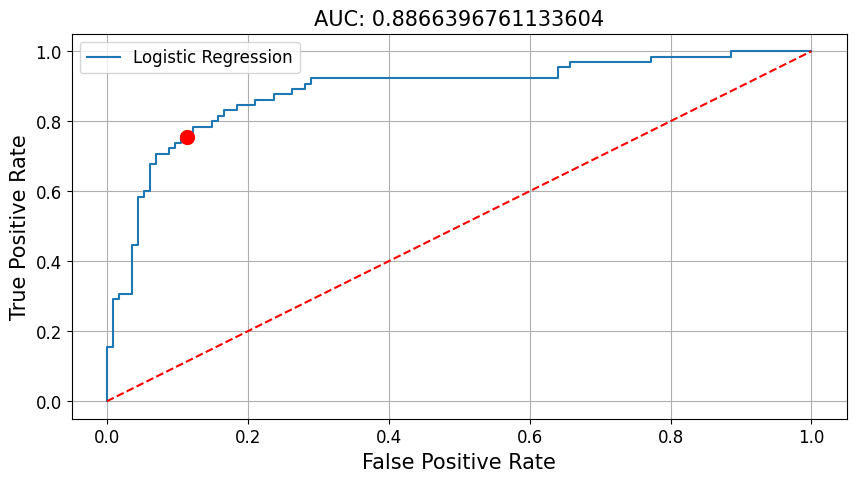

,Accuracy,AUC
Train,0.82,0.81
Test,0.84,0.82


In [38]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','Titanic_WideDeep.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
inputs = Input(shape=(X_train_fes.shape[1],))   
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = concatenate([inputs, hiddens])
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
display(plot_model(model)) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.86      0.89      0.87       114
     class 1       0.79      0.75      0.77        65

    accuracy                           0.84       179
   macro avg       0.83      0.82      0.82       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


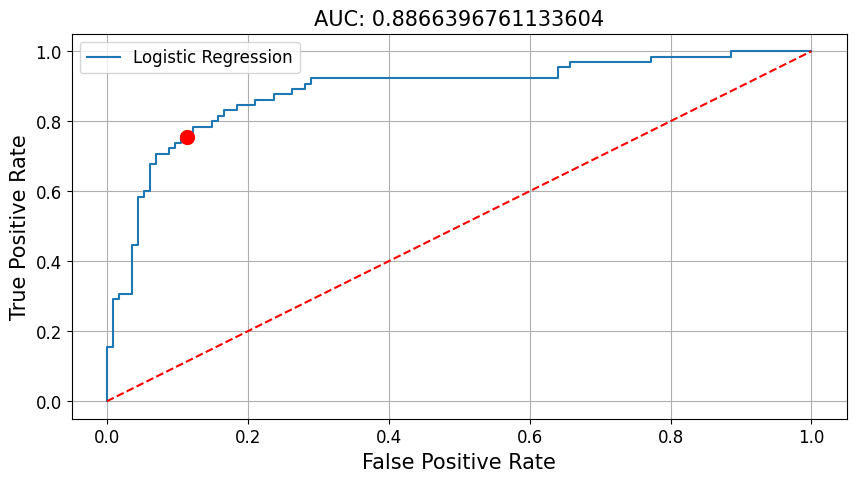

,Accuracy,AUC
Train,0.82,0.81
Test,0.84,0.82


In [39]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

### Customized Version

(712, 11) (712, 1)
(179, 11) (179, 1)


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24      │ (None, 16)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_104 (Dense)   │ (None, 256)       │      4,352 │ input_layer_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_60          │ (None, 256)       │          0 │ dense_104[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_105 (Dense)   │ (None, 128)       │     32,896 │ dropout_60[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_61          │ (None, 128)       │          0 │ dense_105[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_106 (Dense)   │ (None, 64)        │      8,256 │ dropout_61[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_62          │ (None, 64)        │          0 │ dense_106[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_107 (Dense)   │ (None, 32)        │      2,080 │ dropout_62[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_23      │ (None, 16)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_63          │ (None, 32)        │          0 │ dense_107[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 48)        │          0 │ input_layer_23[0… │
│ (Concatenate)       │                   │            │ dropout_63[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_108 (Dense)   │ (None, 1)         │         49 │ concatenate_3[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 47,633 (186.07 KB)

 Trainable params: 47,633 (186.07 KB)

 Non-trainable params: 0 (0.00 B)

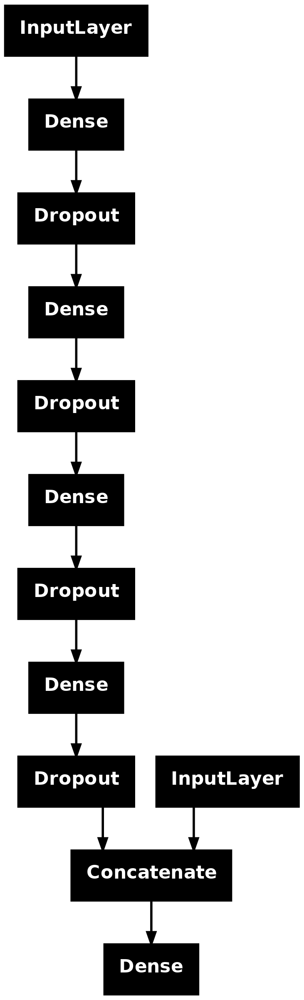

Training Progress: 100%|██████████████████████████████████████████████████████████████| 100/100 [01:30<00:00,  1.10it/s]


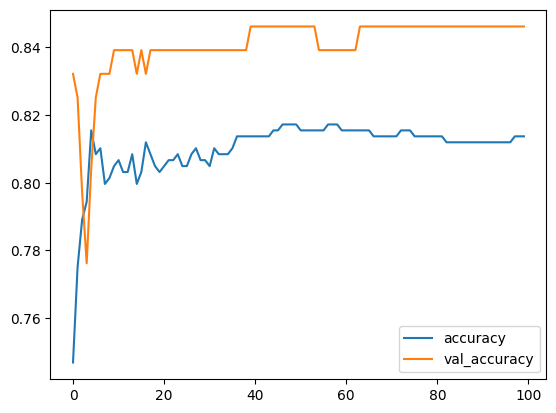

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.86      0.89      0.87       114
     class 1       0.79      0.75      0.77        65

    accuracy                           0.84       179
   macro avg       0.83      0.82      0.82       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


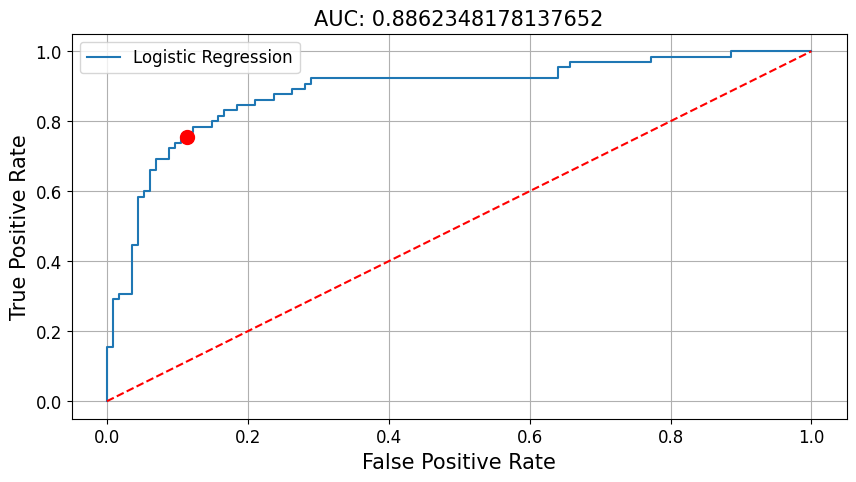

,Accuracy,AUC
Train,0.82,0.81
Test,0.84,0.82


In [40]:
# 하이퍼파라미터
tf.random.set_seed(1)
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'sigmoid'
REGULARIZER = regularizers.l2(0.001)
DROPOUT_RATIO = 0.25
LOSS = 'binary_crossentropy'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE) 
METRICS = ['accuracy']
BATCH_SIZE = 3
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','Titanic_WideDeep.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# 사용자 정의 함수
from module_classification import *

# 데이터 로딩
location = os.path.join('.', 'Data', 'Titanic', 'Titanic.csv')
df = pd.read_csv(location)

# 데이터 전처리
df = fillnull(df)
df = prep(df)

Y_colname = ['Survived']
X_train, X_test, Y_train, Y_test = datasplit(df, Y_colname)

label_colname = ['Sex', 'Cabin', 'Ticket']
encoder = preprocessing.LabelEncoder()
X_train_fe, X_test_fe = label_encoding(X_train, X_test, label_colname, encoder)

onehot_colname = ['Name', 'Embarked']
X_train_fe = onehot_encoding(X_train_fe, onehot_colname)
X_test_fe = onehot_encoding(X_test_fe, onehot_colname)
X_train_fe, X_test_fe = col_mapping(X_train_fe, X_test_fe)  

scaler = preprocessing.MinMaxScaler()
X_train_fes, X_test_fes = scale(scaler, X_train_fe, X_test_fe)

# Neural Network
## 네트워크 구축
###
INPUT_WIDE = X_train_fes.shape[1]
INPUT_DEEP = X_train_fes.shape[1]
X_trainW, X_trainD = X_train_fes.iloc[:,:INPUT_WIDE], X_train_fes.iloc[:,:INPUT_DEEP]
X_testW, X_testD = X_test_fes.iloc[:,:INPUT_WIDE], X_test_fes.iloc[:,:INPUT_DEEP]
X_train_fes = (X_trainW, X_trainD)
X_test_fes = (X_testW, X_testD)
###

inputW = Input(shape=(INPUT_WIDE,))
inputD = Input(shape=(INPUT_DEEP,)) 
hiddens = Dense(256, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputD)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = concatenate([inputW, hiddens])
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model([inputW, inputD], output)  
model.summary() 
display(plot_model(model)) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train_fes, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Confusion Matrix: Test
Classification Metrics: Test
              precision    recall  f1-score   support

     class 0       0.86      0.89      0.87       114
     class 1       0.79      0.75      0.77        65

    accuracy                           0.84       179
   macro avg       0.83      0.82      0.82       179
weighted avg       0.84      0.84      0.84       179

ROC Curve: Test


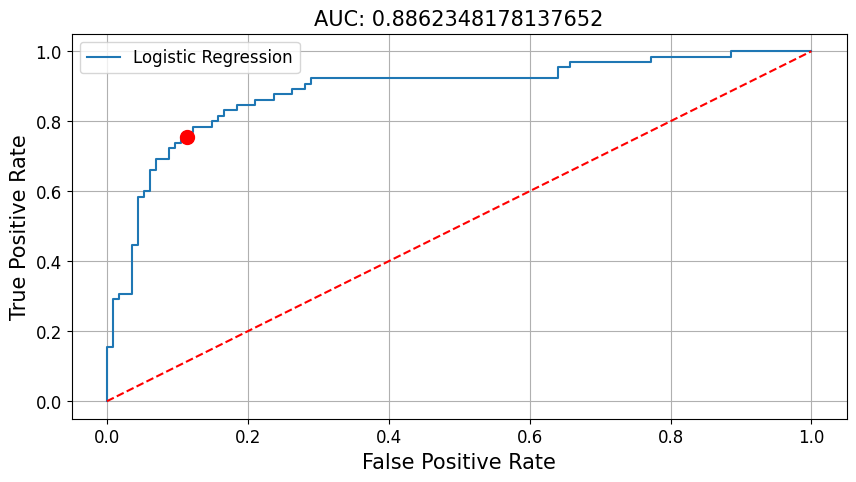

,Accuracy,AUC
Train,0.82,0.81
Test,0.84,0.82


In [41]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
P_trpred = pd.DataFrame(model.predict(X_train_fes), 
                        index=Y_train.index, columns=['Pred'])
P_tepred = pd.DataFrame(model.predict(X_test_fes), 
                        index=Y_test.index, columns=['Pred'])
Y_trpred = (P_trpred >= 0.5).astype(int)
Y_tepred = (P_tepred >= 0.5).astype(int)

# 평가/검증
## Confusion Matrix
print('Confusion Matrix: Test')
evaluation_class_ConfusionMatrix(Y_test, Y_tepred)

## Classification Metrics
print('Classification Metrics: Test')
evaluation_class_ClassificationReport(Y_test, Y_tepred)

## ROC Curve + AUC
print('ROC Curve: Test')
evaluation_class_ROCAUC(Y_test, P_tepred)

## 성능검증
Score_nn = evaluation_class_AccuracyAUC(Y_train, Y_trpred, Y_test, Y_tepred)
Score_nn